<p style="font-family: Arial; font-size:3.75em;color:blue; font-style:bold;text-align:center"><br>
PFA: Taxi Fares Prediction<br></p><br>


<h1 style="font-size:2em;color:#2467C0">1) Exploration et préparation des données </h1>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
1-1) Lecture de données et exploration superficielle <br>
</p>

La première chose à faire avec un ensemble de données est d'explorer les données. Cela signifie qu’enquêter sur le nombre d’entités, leur type de données, leur signification et leurs statistiques.

In [1]:
# Import des modules de Python qu'on va utiliser au départ
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use('seaborn-whitegrid')

Comme cet ensemble de données est énorme, toutes les données nécessiteraient beaucoup de mémoire. Par conséquent, On a lu un nombre limité de lignes lors de l'exploration des données.

In [2]:
# Lire les données sous format dataframe de pandas
df_train =  pd.read_csv('./data/train.csv', nrows = 10_000_000, parse_dates=["pickup_datetime"])

# Lister les premières lignes (Les points de données)
df_train.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21,-73.844311,40.721319,-73.841610,40.712278,1
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16,-74.016048,40.711303,-73.979268,40.782004,1
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00,-73.982738,40.761270,-73.991242,40.750562,2
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42,-73.987130,40.733143,-73.991567,40.758092,1
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00,-73.968095,40.768008,-73.956655,40.783762,1


In [3]:
# Vérifier les types de données
df_train.dtypes

key                          object
fare_amount                 float64
pickup_datetime      datetime64[ns]
pickup_longitude            float64
pickup_latitude             float64
dropoff_longitude           float64
dropoff_latitude            float64
passenger_count               int64
dtype: object

In [4]:
# Vérifier les statistiques des attributs
df_train.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,1.000000e+07,1.000000e+07,1.000000e+07,9.999931e+06,9.999931e+06,1.000000e+07
mean,1.133854e+01,-7.250775e+01,3.991934e+01,-7.250897e+01,3.991913e+01,1.684793e+00
std,9.799930e+00,1.299421e+01,9.322539e+00,1.287532e+01,9.237280e+00,1.323423e+00
min,-1.077500e+02,-3.439245e+03,-3.492264e+03,-3.426601e+03,-3.488080e+03,0.000000e+00
25%,6.000000e+00,-7.399207e+01,4.073491e+01,-7.399139e+01,4.073403e+01,1.000000e+00
50%,8.500000e+00,-7.398181e+01,4.075263e+01,-7.398016e+01,4.075316e+01,1.000000e+00
75%,1.250000e+01,-7.396710e+01,4.076712e+01,-7.396367e+01,4.076810e+01,2.000000e+00
max,1.273310e+03,3.457626e+03,3.344459e+03,3.457622e+03,3.351403e+03,2.080000e+02


<p>Les choses suivantes qu'on a remarquées (lors de l'utilisation de 2 000 000 points de données):</p>
<ul>
<li>Le minimum fare_amount est négatif. Comme cela ne semble pas réaliste, on les supprimera de l'ensemble de données.</li>

<li>Certaines des coordonnées minimales et maximales de longitude / lattitude sont très éloignées. On les supprimera également du jeu de données (on définira un cadre de sélection pour les coordonnées, voir plus loin).</li>

<li>Le montant moyen de fare_amount est d'environ 11,4 USD avec un écart type de 9,9 USD. Lors de la construction d'un modèle prédictif, nous voulons être meilleurs que 9,9 USD.</li>

In [5]:
# Fonction qui nous permet d'afficher le nombre de lignes d'un fichier
def file_len(fname):
    with open(fname) as f:
        for i, l in enumerate(f):
            pass
    return i + 1

In [6]:
# Afficher le nombre de lignes du fichier train.csv
file_len('./data/train.csv')

55423857

In [7]:
# Eliminer les lignes dont le tarif est négatif
print('Old size: %d' % len(df_train))
df_train = df_train[df_train.fare_amount>=0]
print('New size: %d' % len(df_train))

Old size: 10000000
New size: 9999580


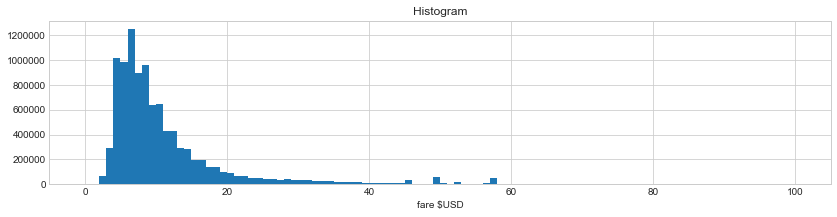

In [8]:
# Afficher l'histogramme du tarif (dont le tarif est inférieur à 100)
df_train[df_train.fare_amount<100].fare_amount.hist(bins=100, figsize=(14,3))
plt.xlabel('fare $USD')
plt.title('Histogram');

Dans l'histogramme du montant fare_amount, il y a quelques petites pointes comprises entre 40 et 60 dollars. Cela pourrait indiquer un prix fixe (par exemple, vers / depuis l’aéroport). Ceci sera exploré plus loin.

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
1-2) Suppression des données manquantes <br>
</p>

Il faut toujours vérifier s'il y a des données manquantes. Comme ce jeu de données est énorme, la suppression de points de données avec des données manquantes n’a probablement aucun effet sur les modèles formés.

In [9]:
# Afficher le nombre des valeurs nulles pour chaque attribut
print(df_train.isnull().sum())

key                   0
fare_amount           0
pickup_datetime       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude    69
dropoff_latitude     69
passenger_count       0
dtype: int64


In [10]:
# Suppression des valeurs nulles
print('Old size: %d' % len(df_train))
df_train = df_train.dropna(how = 'any', axis = 'rows')
print('New size: %d' % len(df_train))

Old size: 9999580
New size: 9999511


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
1-3) Import des données du Test <br>
</p>

On doit lire les données du test pour vérifier les statistiques et les comparez avec l'ensemble de formation.

In [11]:
# Lire les données sous format dataframe de pandas
df_test =  pd.read_csv('./data/test.csv', parse_dates=["pickup_datetime"])
df_test.head(5)

,key,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2015-01-27 13:08:24.0000002,2015-01-27 13:08:24,-73.973320,40.763805,-73.981430,40.743835,1
1,2015-01-27 13:08:24.0000003,2015-01-27 13:08:24,-73.986862,40.719383,-73.998886,40.739201,1
2,2011-10-08 11:53:44.0000002,2011-10-08 11:53:44,-73.982524,40.751260,-73.979654,40.746139,1
3,2012-12-01 21:12:12.0000002,2012-12-01 21:12:12,-73.981160,40.767807,-73.990448,40.751635,1
4,2012-12-01 21:12:12.0000003,2012-12-01 21:12:12,-73.966046,40.789775,-73.988565,40.744427,1


In [12]:
# Vérifier les statistiques des attributs
df_test.describe()

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,9914.000000,9914.000000,9914.000000,9914.000000,9914.000000
mean,-73.974722,40.751041,-73.973657,40.751743,1.671273
std,0.042774,0.033541,0.039072,0.035435,1.278747
min,-74.252193,40.573143,-74.263242,40.568973,1.000000
25%,-73.992501,40.736125,-73.991247,40.735254,1.000000
50%,-73.982326,40.753051,-73.980015,40.754065,1.000000
75%,-73.968013,40.767113,-73.964059,40.768757,2.000000
max,-72.986532,41.709555,-72.990963,41.696683,6.000000


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
1-4) Données et localisation <br>
</p>

Comme nous traitons des données de localisation, on veut tracer les coordonnées sur une carte. Cela donne une meilleure vue des données.<br>
 longitude = -74.0063889 <br>
 lattitude = 40.7141667<br>
On définit une boîte englobante d'intérêt en utilisant [long_min, long_max, latt_min, latt_max] en utilisant les coordonnées minimale et maximale du jeu de tests. De cette façon, on est sûr de former un modèle pour toute la plage de coordonnées de prélèvement / extraction de l'ensemble de test.


In [13]:
# Longitude minimum et maximum dans les données de test
min(df_test.pickup_longitude.min(), df_test.dropoff_longitude.min()), \
max(df_test.pickup_longitude.max(), df_test.dropoff_longitude.max())

(-74.263242, -72.986532)

In [14]:
# Latitude minimum et maximum dans les données de test
min(df_test.pickup_latitude.min(), df_test.dropoff_latitude.min()), \
max(df_test.pickup_latitude.max(), df_test.dropoff_latitude.max())

(40.568973, 41.709555)

In [15]:
# Fonction qui nous permet de savoir les points de données qui sont à l'intérieur des frontières (minLong,maxLong,minLat,maxLat)
def select_within_boundingbox(df, BB):
    return (df.pickup_longitude >= BB[0]) & (df.pickup_longitude <= BB[1]) & \
           (df.pickup_latitude >= BB[2]) & (df.pickup_latitude <= BB[3]) & \
           (df.dropoff_longitude >= BB[0]) & (df.dropoff_longitude <= BB[1]) & \
           (df.dropoff_latitude >= BB[2]) & (df.dropoff_latitude <= BB[3])
            
# Charger l'image de la carte de New York
BB = (-74.5, -72.8, 40.5, 41.8)
nyc_map = plt.imread('./nyc_-74.5_-72.8_40.5_41.8.png')

# Charger l'image de zoom de la carte de New York
BB_zoom = (-74.3, -73.7, 40.5, 40.9)
nyc_map_zoom = plt.imread('./nyc_-74.3_-73.7_40.5_40.9.png')

In [16]:
# Supprimer les points de donnée qui sont à l'extérieur de New York
print('Old size: %d' % len(df_train))
df_train = df_train[select_within_boundingbox(df_train, BB)]
print('New size: %d' % len(df_train))

Old size: 9999511
New size: 9787199


In [17]:
# Cette fonction sera utilisée souvent pour tracer des données sur la carte de New York
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(df.pickup_longitude, df.pickup_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(df.dropoff_longitude, df.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

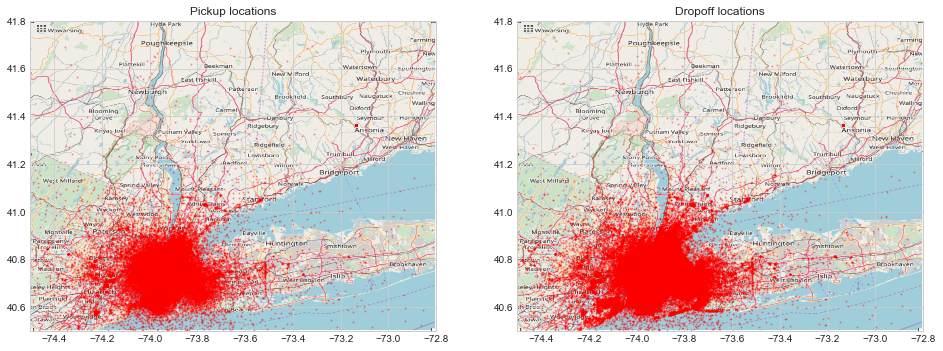

In [18]:
# Afficher les données d'entraînement sur la carte
plot_on_map(df_train, BB, nyc_map, s=1, alpha=0.3)

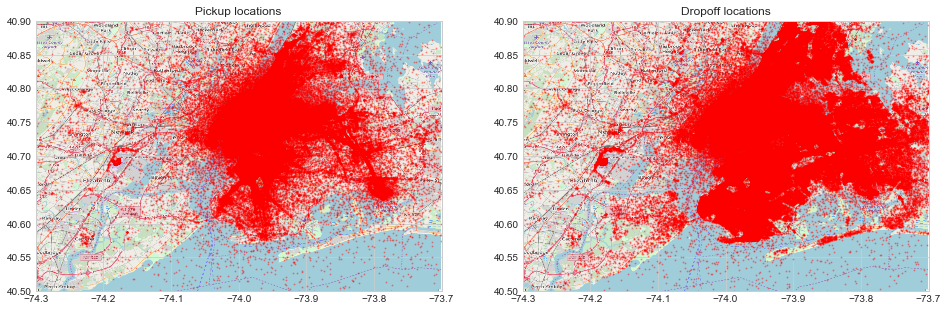

In [19]:
# Afficher les données d'entraînement sur la carte aggrandie (zoom in)
plot_on_map(df_train, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

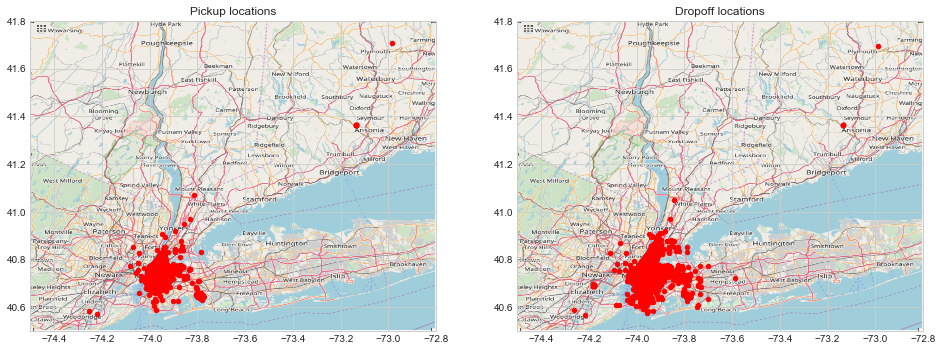

In [20]:
# Afficher les données de test sur la carte
plot_on_map(df_test, BB, nyc_map, alpha=1.0, s=20)

Dans le diagramme de dispersion des données d'entraînement, nous voyons que certains endroits sont dans l'eau. Ceux-ci sont considérés comme du bruit, on a décider de les supprimer de l'ensemble de données.

In [21]:
# Cette fonction nous affiche la dispersion des points de données (les points rouges les points de pick_up (départ)
# et les points bleus dont les points de dropoff (arrivée)
def plot_hires(df, BB, figsize=(12, 12), ax=None, c=('r', 'b')):
    if ax == None:
        fig, ax = plt.subplots(1, 1, figsize=figsize)

    idx = select_within_boundingbox(df, BB)
    ax.scatter(df[idx].pickup_longitude, df[idx].pickup_latitude, c=c[0], s=0.01, alpha=0.5)
    ax.scatter(df[idx].dropoff_longitude, df[idx].dropoff_latitude, c=c[1], s=0.01, alpha=0.5)

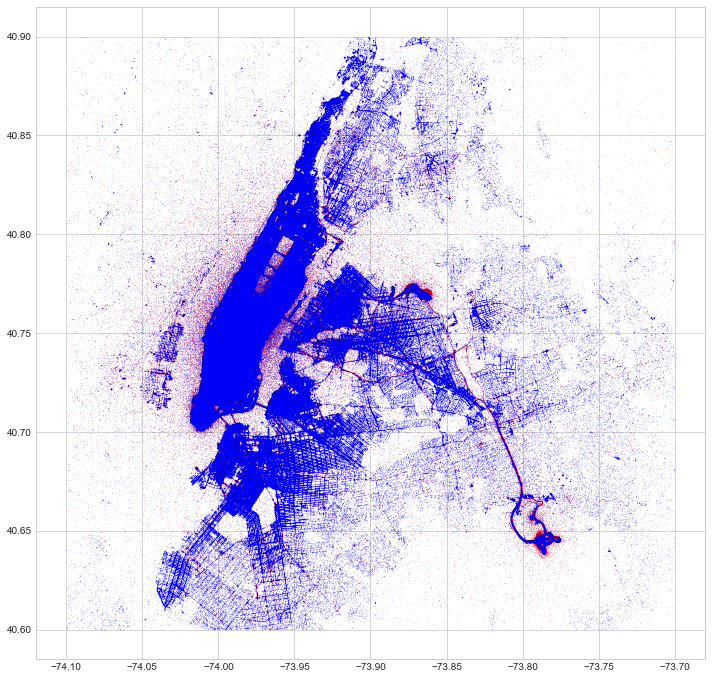

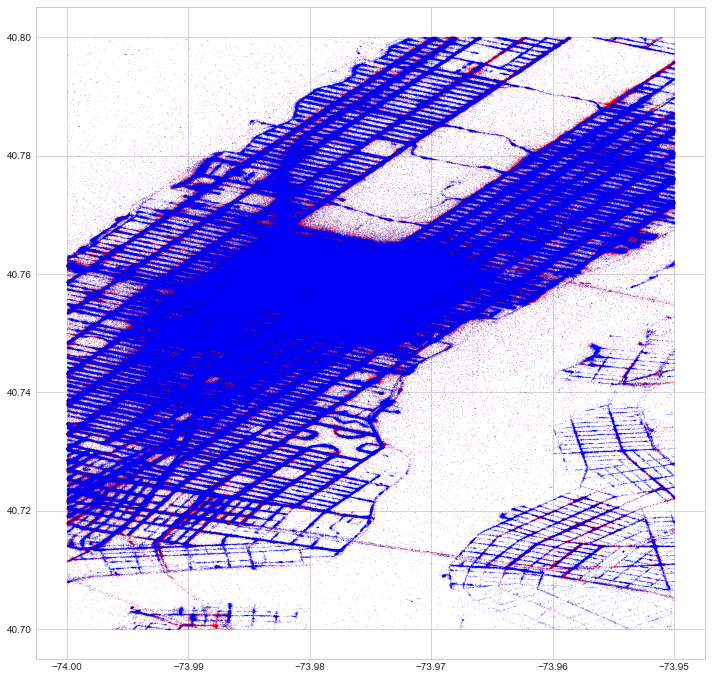

In [22]:
# Affciher la dispersion normale et en cas de zoom in
plot_hires(df_train, (-74.1, -73.7, 40.6, 40.9))
plot_hires(df_train, (-74, -73.95, 40.7, 40.8))

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
1-5) Suppression des points qui se trouvent dans l'eau <br>
</p>

Comme on peut le voir sur la carte les diagrammes de dispersion ci-dessus, certains points de données sont situés dans l'eau. Ce sont évidemment des points de données bruyants. Pour supprimer ces points de données, on crée une carte booléenne terre / eau à partir de la carte de New York. Pour cela, on l'a changé afin de définir la couleur bleue de l'eau et nettoyer la carte. La carte obtenue est affichée ci-dessous.

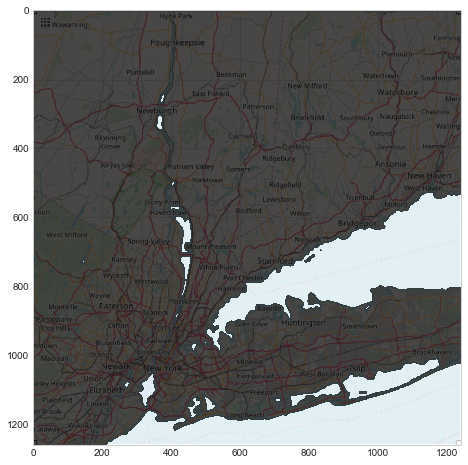

In [23]:
# Lire l'image new york mask et la transformer en un carte booléenne
# Terre = True, eau = False
nyc_mask = plt.imread('./nyc_mask-74.5_-72.8_40.5_41.8.png')[:,:,0] > 0.9

plt.figure(figsize=(8,8))
plt.imshow(nyc_map, zorder=0)
plt.imshow(nyc_mask, zorder=1, alpha=0.7); # note: True est affiché en Noir, False en blanc.

Ensuite, on doit convertir les coordonnées de longitude / latitude en coordonnées de pixel xy. La fonction lonlat_to_xy implémente cette transformation. Noter que la coordonnée y doit être inversée car l’axe y de l’image est dirigé de haut en bas.
<br>
Une fois pour tous les points de données, les coordonnées de pixels xy sont calculées, un index booléen est calculé à l'aide du masque NYC.

In [24]:
# Change les coordonnées longitude/latitude en coordonnées xy d'une image
def lonlat_to_xy(longitude, latitude, width, height, BB):
    return (width*(longitude - BB[0])/(BB[1]-BB[0])).astype('int'), \
           (height - height*(latitude - BB[2])/(BB[3]-BB[2])).astype('int')

In [25]:
# On change les coordonnées longitude/latitude du pickup(départ) en coordonnées xy d'une image
pickup_x, pickup_y = lonlat_to_xy(df_train.pickup_longitude, df_train.pickup_latitude, 
                                  nyc_mask.shape[1], nyc_mask.shape[0], BB)
# On change les coordonnées longitude/latitude du dropoff(arrivée) en coordonnées xy d'une image
dropoff_x, dropoff_y = lonlat_to_xy(df_train.dropoff_longitude, df_train.dropoff_latitude, 
                                  nyc_mask.shape[1], nyc_mask.shape[0], BB)

In [26]:
# On va affcihe les nombre de points qui sont dans l'eau
idx = (nyc_mask[pickup_y, pickup_x] & nyc_mask[dropoff_y, dropoff_x])
print("Number of trips in water: {}".format(np.sum(~idx)))

Number of trips in water: 2025


In [27]:
#fonction qui nous permet de supprimer les points qui sont dans l'eau
def remove_datapoints_from_water(df):
    def lonlat_to_xy(longitude, latitude, dx, dy, BB):
        return (dx*(longitude - BB[0])/(BB[1]-BB[0])).astype('int'), \
               (dy - dy*(latitude - BB[2])/(BB[3]-BB[2])).astype('int')

    # define bounding box
    BB = (-74.5, -72.8, 40.5, 41.8)
    
    # read nyc mask and turn into boolean map with
    # land = True, water = False
    nyc_mask = plt.imread('https://aiblog.nl/download/nyc_mask-74.5_-72.8_40.5_41.8.png')[:,:,0] > 0.9
    
    # calculate for each lon,lat coordinate the xy coordinate in the mask map
    pickup_x, pickup_y = lonlat_to_xy(df.pickup_longitude, df.pickup_latitude, 
                                      nyc_mask.shape[1], nyc_mask.shape[0], BB)
    dropoff_x, dropoff_y = lonlat_to_xy(df.dropoff_longitude, df.dropoff_latitude, 
                                      nyc_mask.shape[1], nyc_mask.shape[0], BB)    
    # calculate boolean index
    idx = nyc_mask[pickup_y, pickup_x] & nyc_mask[dropoff_y, dropoff_x]
    
    # return only datapoints on land
    return df[idx]

In [28]:
# On supprime les poinst qui sont dans l'eau et on affiche le nombre de points de donnée avant et après la suppression
print('Old size: %d' % len(df_train))
df_train = remove_datapoints_from_water(df_train)
print('New size: %d' % len(df_train))

Old size: 9787199
New size: 9785174


Voyons maintenant si toutes les valeurs aberrantes dans l'eau ont disparu !

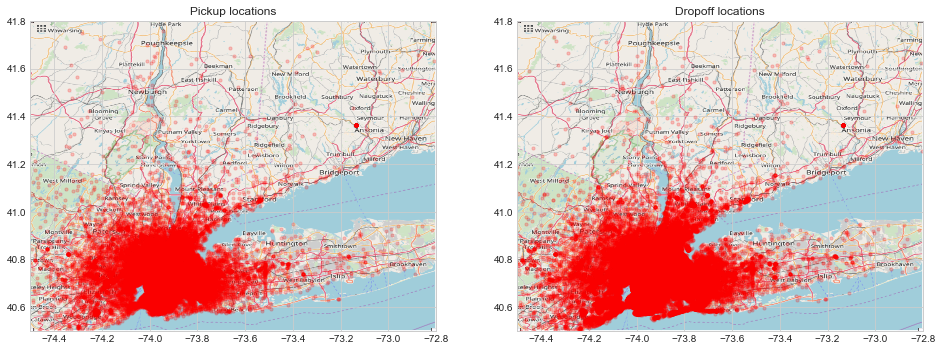

In [29]:
# Afficher les données d'entraînement sur la carte aggrandie (zoom in)
plot_on_map(df_train, BB, nyc_map)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
1-6) Densité des points par mile² <br>
</p>

Un diagramme de dispersion des lieux de pickup et de dropoff donne une impression rapide de la densité. Cependant, il est plus précis de compter le nombre de points de données par zone pour visualiser la densité. Le code ci-dessous compte les points de données de pickup et de dropoff par mile carré. Cela donne une meilleure vue sur les «points chauds».

In [30]:
# Pour cette visualisation et l'analyse qui va venir, nous avons besoin d’une fonction permettant de calculer la distance en miles
# entre des positions en coordonnées lon, lat.
# Cette fonction est basée sur https://stackoverflow.com/questions/27928/
# Calcule la distance entre deux points (latitude,longitude) en utilisant la formule haversine
# Retourne une distance en miles
def distance(lat1, lon1, lat2, lon2):
    p = 0.017453292519943295 # Pi/180
    a = 0.5 - np.cos((lat2 - lat1) * p)/2 + np.cos(lat1 * p) * np.cos(lat2 * p) * (1 - np.cos((lon2 - lon1) * p)) / 2
    return 0.6213712 * 12742 * np.arcsin(np.sqrt(a)) # 2*R*asin...

# On calcule d’abord deux tableaux avec une densité de points de données par mile carré
n_lon, n_lat = 200, 200 # nombre de cases de grille par la dimension de longitude et de latitude
density_pickup, density_dropoff = np.zeros((n_lat, n_lon)), np.zeros((n_lat, n_lon)) # on prépare les tableaux

# Pour calculer le nombre de points de données dans une zone de grille, la fonction numpy.digitize () est utilisée
# Cette fonction nécessite un tableau avec les bins (emplacements) pour compter le nombre de points de données par bin.
bins_lon = np.zeros(n_lon+1) # bin de longitude
bins_lat = np.zeros(n_lat+1) # bin de latitude
delta_lon = (BB[1]-BB[0]) / n_lon # largeur du bin (en coordonnées) de longutide 
delta_lat = (BB[3]-BB[2]) / n_lat # hauteur du bin (en coordonnées) de latitude
bin_width_miles = distance(BB[2], BB[1], BB[2], BB[0]) / n_lon # largeur du bin en miles
bin_height_miles = distance(BB[3], BB[0], BB[2], BB[0]) / n_lat #  hauteur du bin en miles
for i in range(n_lon+1):
    bins_lon[i] = BB[0] + i * delta_lon
for j in range(n_lat+1):
    bins_lat[j] = BB[2] + j * delta_lat
    
# Utiliser la fonction numpy.digitize() par dimension de longitude et de latitude
inds_pickup_lon = np.digitize(df_train.pickup_longitude, bins_lon)
inds_pickup_lat = np.digitize(df_train.pickup_latitude, bins_lat)
inds_dropoff_lon = np.digitize(df_train.dropoff_longitude, bins_lon)
inds_dropoff_lat = np.digitize(df_train.dropoff_latitude, bins_lat)

# Compter les nombres de points par bin
# note: Comme la densité_pickup sera affiché comme une image, le premier index est la direction y,
#       le deuxième index est la direction x. En outre, la direction y doit être inversée pour
#       afficher correctement (donc le terme (n_lat-j))
dxdy = bin_width_miles * bin_height_miles
for i in range(n_lon):
    for j in range(n_lat):
        density_pickup[j, i] = np.sum((inds_pickup_lon==i+1) & (inds_pickup_lat==(n_lat-j))) / dxdy
        density_dropoff[j, i] = np.sum((inds_dropoff_lon==i+1) & (inds_dropoff_lat==(n_lat-j))) / dxdy

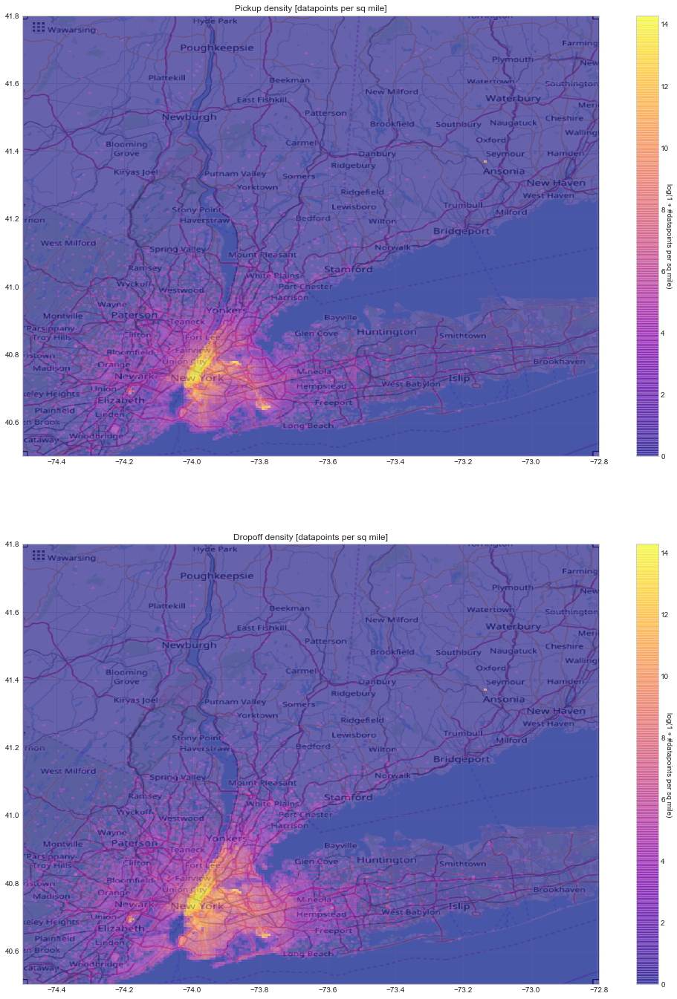

In [31]:
# Visualiser les tableaux de densité
fig, axs = plt.subplots(2, 1, figsize=(18, 24))
axs[0].imshow(nyc_map, zorder=0, extent=BB);
im = axs[0].imshow(np.log1p(density_pickup), zorder=1, extent=BB, alpha=0.6, cmap='plasma')
axs[0].set_title('Pickup density [datapoints per sq mile]')
cbar = fig.colorbar(im, ax=axs[0])
cbar.set_label('log(1 + #datapoints per sq mile)', rotation=270)

axs[1].imshow(nyc_map, zorder=0, extent=BB);
im = axs[1].imshow(np.log1p(density_dropoff), zorder=1, extent=BB, alpha=0.6, cmap='plasma')
axs[1].set_title('Dropoff density [datapoints per sq mile]')
cbar = fig.colorbar(im, ax=axs[1])
cbar.set_label('log(1 + #datapoints per sq mile)', rotation=270)

Ces graphiques montrent clairement que les points de données se concentrent autour de Manhatten et des trois aéroports (JFK, EWS, LGR). Il y a aussi un hotspot près de Seymour (coin supérieur droit). 

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
1-7) Densité du trafic lors pickup 
</p>

Les diagrammes de densité ci-dessus nous monter qu'on peut visualiser la densité du trafic à l'heure (et l'année). <br>
En comptant le nombre de camionnettes dans une région, nous devrions avoir une idée de la densité du trafic. Plus il y a de trafic, plus il faut de temps pour conduire.

In [32]:
# Ajout d'attributs liés au temps
df_train['year'] = df_train.pickup_datetime.apply(lambda t: t.year)
df_train['weekday'] = df_train.pickup_datetime.apply(lambda t: t.weekday())
df_train['hour'] = df_train.pickup_datetime.apply(lambda t: t.hour)

In [33]:
# Quelques constantes nécessaires pour le calcul de la densité du traffic lors du pickup
n_hours = 24
n_weekdays = 7
n_years = 7
n_bins_lon = 30
n_bins_lat = 30

# On se concentre sur le trafic à Manhattan
BB_traffic = (-74.025, -73.925, 40.7, 40.8)

# On définit une fonction qui permet le calcul de la densité du traffic lors du pickup
def calculate_trafic_density(df):
    traffic = np.zeros((n_years, n_weekdays, n_hours, n_bins_lat, n_bins_lon))
    
    # Pour calculer le nombre de points de données dans une zone de grille, la fonction numpy.digitize () est utilisée
    # Cette fonction nécessite un tableau avec les bins (emplacements) pour compter le nombre de points de données par bin.
    
    bins_lon = np.zeros(n_bins_lon+1) # bin de longitude
    bins_lat = np.zeros(n_bins_lat+1) # bin de latitude
    
    delta_lon = (BB_traffic[1]-BB_traffic[0]) / n_bins_lon # largeur du bin (en coordonnées) de longutide 
    delta_lat = (BB_traffic[3]-BB_traffic[2]) / n_bins_lat # hauteur du bin (en coordonnées) de latitude
    
    for i in range(n_bins_lon+1):
        bins_lon[i] = BB_traffic[0] + i * delta_lon
    for j in range(n_bins_lat+1):
        bins_lat[j] = BB_traffic[2] + j * delta_lat
    
    # Compter les nombres de points par bin
    # note: Comme la densité_pickup sera affiché comme une image, le premier index est la direction y,
    #       le deuxième index est la direction x. En outre, la direction y doit être inversée pour
    #       afficher correctement (donc le terme (n_lat-j))
    for y in range(n_years):
        for d in range(n_weekdays):
            for h in range(n_hours):
                idx = (df.year==(2009+y)) & (df.weekday==d) & (df.hour==h)

                # Utiliser la fonction numpy.digitize() par dimension de longitude et de latitude
                inds_pickup_lon = np.digitize(df[idx].pickup_longitude, bins_lon)
                inds_pickup_lat = np.digitize(df[idx].pickup_latitude, bins_lat)

                for i in range(n_bins_lon):
                    for j in range(n_bins_lat):
                        traffic[y, d, h, j, i] = traffic[y, d, h, j, i] + \
                                                 np.sum((inds_pickup_lon==i+1) & (inds_pickup_lat==j+1))
    
    return traffic 

# On définit une fonction qui visualise la densité du traffic lors du pickup
def plot_traffic(traffic, y, d):
    days = {'monday' : 0, 'tuesday' : 1, 'wednesday' : 2, 'thursday' : 3, 'friday' : 4, 'saturday' : 5, 'sunday' : 6}
    fig, axs = plt.subplots(3,8,figsize=(18,7))
    axs = axs.ravel()
    for h in range(24):
        axs[h].imshow(traffic[y-2009,days[d],h,::-1,:], zorder=1, cmap='coolwarm', clim=(0, traffic.max()))
        axs[h].get_xaxis().set_visible(False)
        axs[h].get_yaxis().set_visible(False)
        axs[h].set_title('h={}'.format(h))
    fig.suptitle("Pickup traffic density, year={}, day={} (max_pickups={})".format(y, d, traffic.max()))

Calculons maintenant la densité et visualisons les graphiques.
<br><br>
<b>NOTE</b>: La qualité des tracés dépend du nombre de points de données utilisés. Ce notebook utilise par défaut 2 000 000 points, ce qui n'est pas suffisant pour de bons graphiques de densité de trafic. On doit augmenter donc le nombre de points pour si on veut obtenir de meilleurs graphiques.

In [34]:
traffic = calculate_trafic_density(df_train)

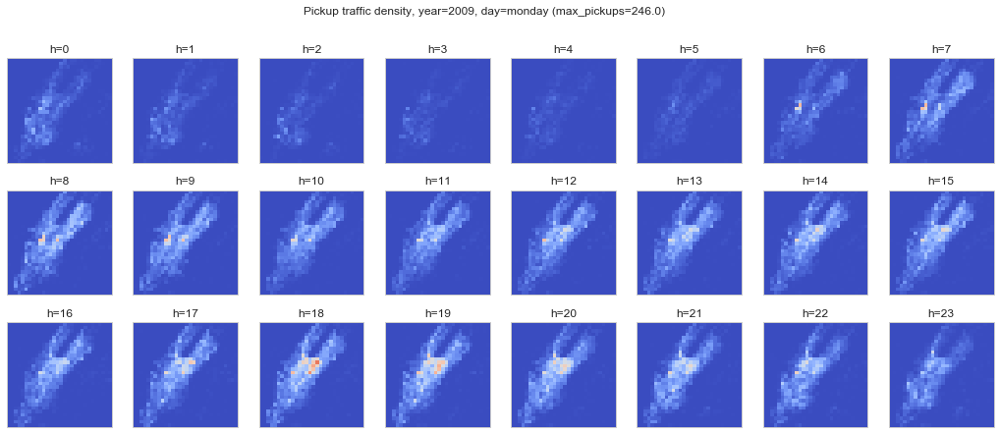

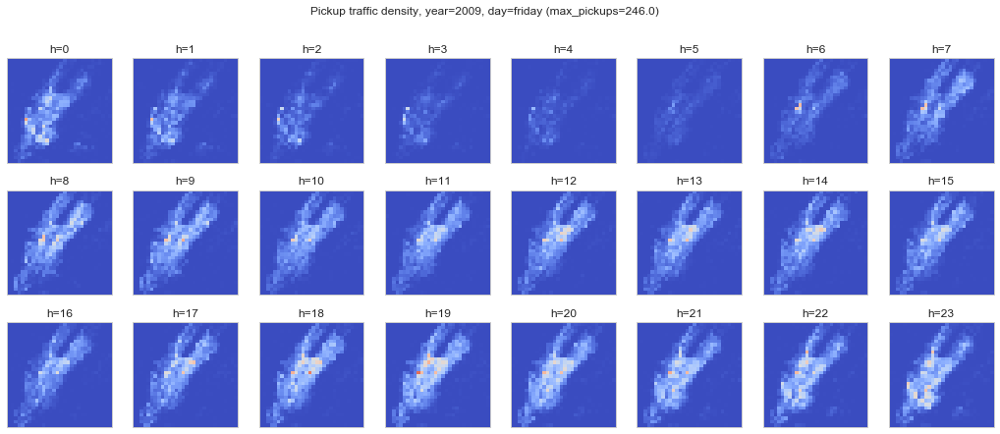

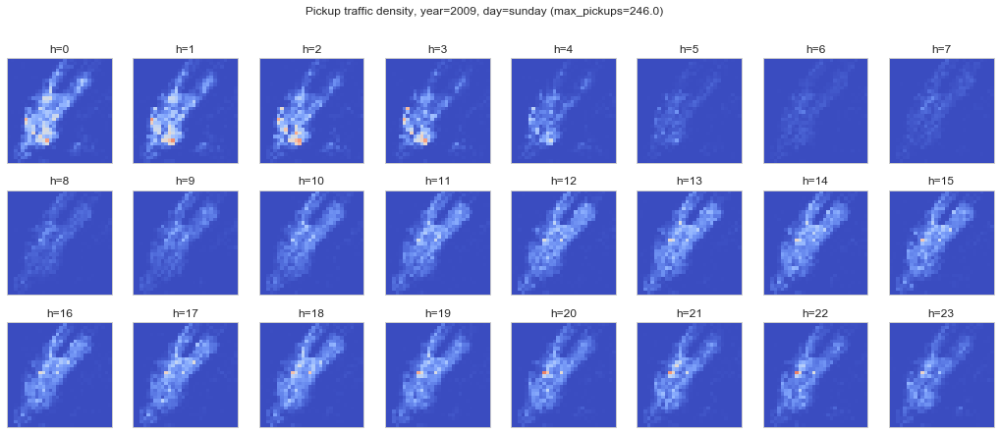

In [35]:
plot_traffic(traffic, 2009, 'monday')
plot_traffic(traffic, 2009, 'friday')
plot_traffic(traffic, 2009, 'sunday')

Déjà à partir de ces visualisations, nous pouvons voir les différents modèles de densité de trafic par heure, mais aussi par lieu. Par exemple. le dimanche, h = 0 à 3 heures (du samedi soir au dimanche), la circulation est plus dense qu'en semaine. On suppose que cela vient des gens qui sortent et profitent du week-end. Visualisons également une autre année.

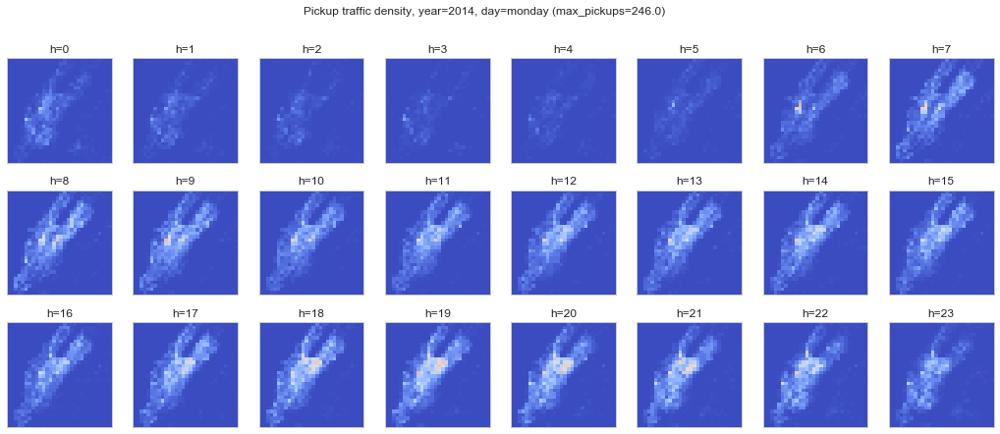

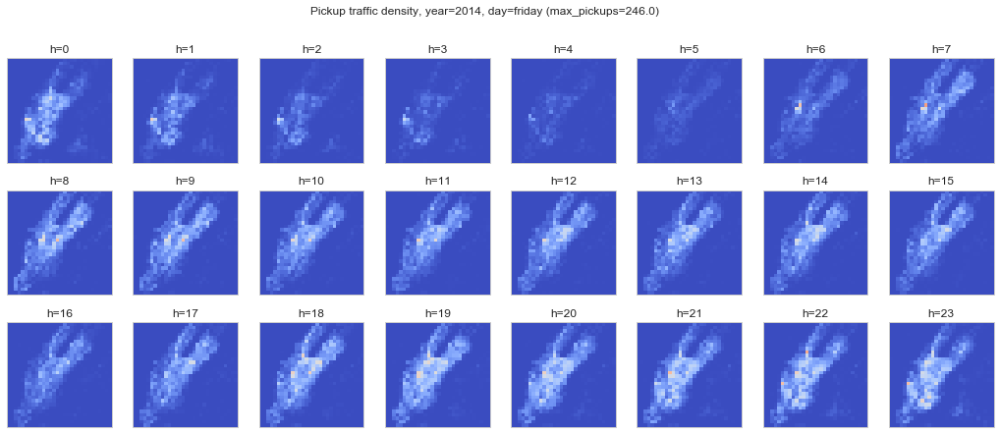

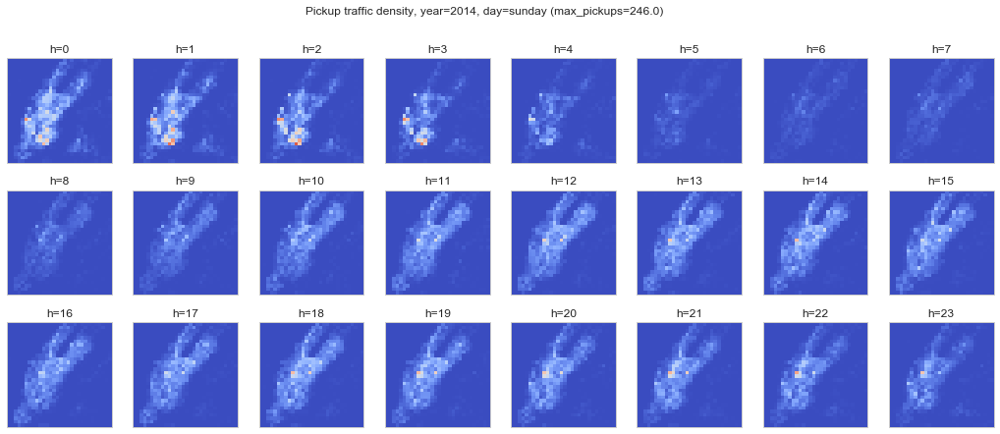

In [36]:
plot_traffic(traffic, 2014, 'monday')
plot_traffic(traffic, 2014, 'friday')
plot_traffic(traffic, 2014, 'sunday')

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
1-8) Distance et temps: Visualisation <br>
</p>

Avant de construire un modèle, on souhaite tester une «intuition» de base:<br>
<ul>
<li>Plus la distance entre le lieu de prise en charge et le lieu de départ est longue, plus le tarif est élevé.</li>
<li>Certains voyages, comme vers / depuis un aéroport, sont des frais fixes.</li>
<li>Le tarif de nuit est différent de celui du jour.</li>
</ul>
Alors, vérifions.

<p style="font-family: Arial; font-size:1.5em;color:#4402C0; font-style:bold">
1) Distance et tarif<br>
</p>

<b>Plus la distance entre le lieu de prise en charge et le lieu de départ est longue, plus le tarif est élevé.</b><br>
Pour visualiser la relation distance-tarif, nous devons d’abord calculer la distance d’un voyage.

count    9.785174e+06
mean     2.066449e+00
std      2.339431e+00
min      0.000000e+00
25%      7.788996e-01
50%      1.337289e+00
75%      2.428103e+00
max      8.937474e+01
Name: distance_miles, dtype: float64

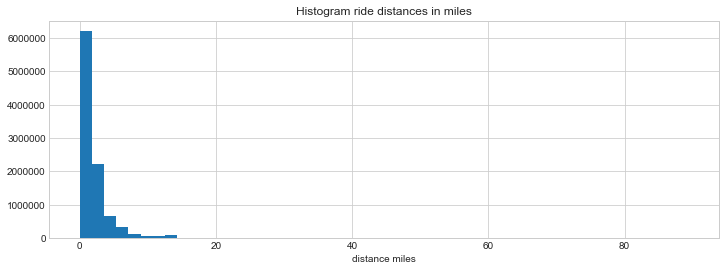

In [37]:
# Ajouter une nouvelle colonne au dataframe avec une distance en miles
df_train['distance_miles'] = distance(df_train.pickup_latitude, df_train.pickup_longitude, \
                                      df_train.dropoff_latitude, df_train.dropoff_longitude)

df_train.distance_miles.hist(bins=50, figsize=(12,4))
plt.xlabel('distance miles')
plt.title('Histogram ride distances in miles')
df_train.distance_miles.describe()

Il semble que la plupart des trajets ne sont que de courts trajets, avec un petit sommet à 13 miles environ. Ce pic pourrait être dû aux déplacements vers les aéroports.
<br><br>
Voyons également l'influence de <b>passenger_count.<b>

In [38]:
df_train.groupby('passenger_count')['distance_miles', 'fare_amount'].mean()

,distance_miles,fare_amount
passenger_count,,
0,1.760921,8.949456
1,2.036864,11.187809
2,2.181362,11.797737
3,2.104317,11.522296
4,2.138315,11.744793
5,2.072235,11.204020
6,2.111283,12.125370
7,1.294196,11.500000
9,6.178769,57.290000


Un nombre de passagers égal à zéro semble étrange. Peut-être un taxi transportant des marchandises ou une erreur administrative? Ce dernier ne semble pas être le cas, car le montant de fare_amount est nettement inférieur.
<br><br>
Au lieu d'utiliser fare_amount, on va utiliser «tarif au miles» qui fournit également des informations utiles.

In [39]:
print("Average $USD/Mile : {:0.2f}".format(df_train.fare_amount.sum()/df_train.distance_miles.sum()))

Average $USD/Mile : 5.48


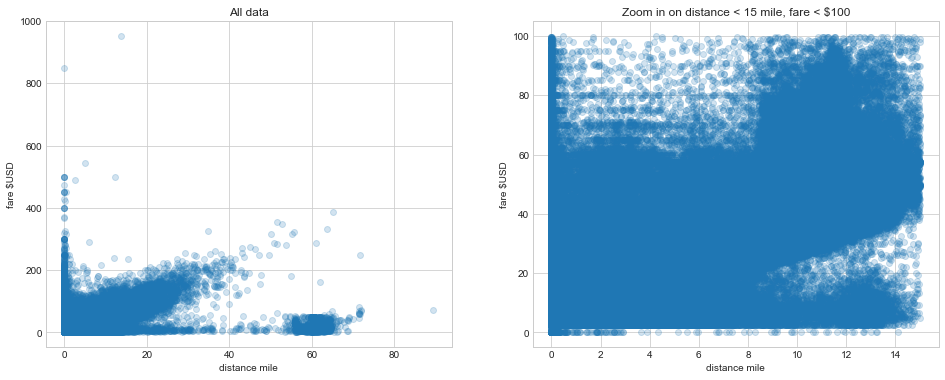

In [40]:
# Visualisation de la dispersion distance - tarif
fig, axs = plt.subplots(1, 2, figsize=(16,6))
axs[0].scatter(df_train.distance_miles, df_train.fare_amount, alpha=0.2)
axs[0].set_xlabel('distance mile')
axs[0].set_ylabel('fare $USD')
axs[0].set_title('All data')

# On zoome sur une partie des données
idx = (df_train.distance_miles < 15) & (df_train.fare_amount < 100)
axs[1].scatter(df_train[idx].distance_miles, df_train[idx].fare_amount, alpha=0.2)
axs[1].set_xlabel('distance mile')
axs[1].set_ylabel('fare $USD')
axs[1].set_title('Zoom in on distance < 15 mile, fare < $100');

De cette visualisation on remarque:
<ul>
<li>Il existe des trajets avec une distance nulle mais avec un tarif non nul. Serait-ce des voyages à partir et vers le même endroit? La prédiction de ces tarifs sera difficile car il n’y a probablement pas assez d’informations dans le dataset.</li>
<li>Il y a des trajets avec une distance supérieur à 50 miles mais à bas prix. Peut-être que ce sont des voyages à prix réduit? Ou c'est le point chaud mentionné précédemment près de Seymour? (Voir la visualisation des densités par mile)</li>
<li>Les lignes horizontales dans la visualisation de droite pourraient indiquer à nouveau les trajets à tarif fixe de/à l'aéroport JFK.</li>
<li>Globalement, il semble exister une relation (linéaire) entre la distance et le tarif, avec un taux
moyen de +/- 100/20 = 5 $ USD / mile.</li>
</ul>
<b>NOTE</b>: La distance calculée dans le dataset est la distance entre les deux points. En réalité, la distance mesurée par la route est plus grande.

In [41]:
# Supprimer les points de données avec une distance <0,05 miles
idx = (df_train.distance_miles >= 0.05)
print('Old size: %d' % len(df_train))
df_train = df_train[idx]
print('New size: %d' % len(df_train))

Old size: 9785174
New size: 9629715


<p style="font-family: Arial; font-size:1.5em;color:#4402C0; font-style:bold">
2) Cas des déplacements vers l'aéroport<br>
</p>

Une autre façon d'explorer ces données consiste à vérifier les déplacements vers / depuis des lieux bien connus. Par exemple. un voyage à l'aéroport JFK. En fonction de la distance, un voyage vers un aéroport est souvent un prix fixe.

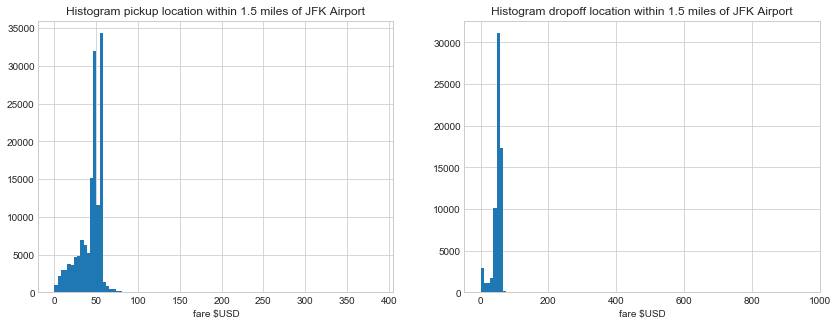

In [42]:
# Coordonnées de l'aéroport JFK, voir https://www.travelmath.com/airport/JFK
jfk = (-73.7822222222, 40.6441666667)
nyc = (-74.0063889, 40.7141667)

# Fonction qui nous permet d'afficher un histogramme du tarif des point dont le pickup ou le dropoff 
# est près d'une localisation choisie
def plot_location_fare(loc, name, range=1.5):
    # Sélectionner tous les points de données avec un pickup près de l'aéroport
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))
    idx = (distance(df_train.pickup_latitude, df_train.pickup_longitude, loc[1], loc[0]) < range)
    df_train[idx].fare_amount.hist(bins=100, ax=axs[0])
    axs[0].set_xlabel('fare $USD')
    axs[0].set_title('Histogram pickup location within {} miles of {}'.format(range, name))

    # Sélectionner tous les points de données avec un un dropoff près de l'aéroport
    idx = (distance(df_train.dropoff_latitude, df_train.dropoff_longitude, loc[1], loc[0]) < range)
    df_train[idx].fare_amount.hist(bins=100, ax=axs[1])
    axs[1].set_xlabel('fare $USD')
    axs[1].set_title('Histogram dropoff location within {} miles of {}'.format(range, name));
    
plot_location_fare(jfk, 'JFK Airport')

Il semble qu'il y ait des prix fixes vers / depuis l'aéroport.
<br><br>Faisons de même pour les deux autres aéroports.

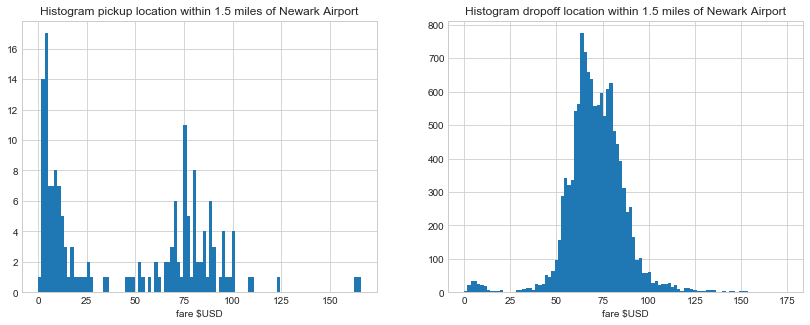

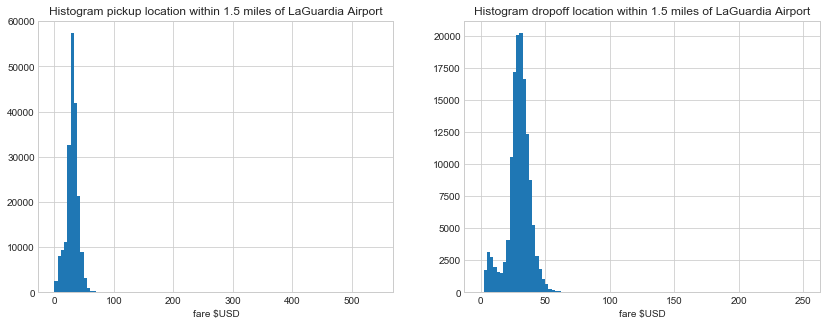

In [43]:
ewr = (-74.175, 40.69) # Newark Liberty International Airport, voir https://www.travelmath.com/airport/EWR
lgr = (-73.87, 40.77) # LaGuardia Airport, voir https://www.travelmath.com/airport/LGA
plot_location_fare(ewr, 'Newark Airport')
plot_location_fare(lgr, 'LaGuardia Airport')

<p style="font-family: Arial; font-size:1.5em;color:#4402C0; font-style:bold">
3) Tarif pendant la nuit<br>
</p>

Pour visualiser la relation entre l'heure et le tarif / mile, trois colonnes supplémentaires sont ajoutées aux données: l'année, l'heure du jour et le tarif en USD par mile.

In [44]:
df_train['fare_per_mile'] = df_train.fare_amount / df_train.distance_miles
df_train.fare_per_mile.describe()

count    9.629715e+06
mean     7.421222e+00
std      1.203639e+01
min      0.000000e+00
25%      4.769208e+00
50%      6.134182e+00
75%      8.087937e+00
max      3.843753e+03
Name: fare_per_mile, dtype: float64

Le tarif par distance est proportionnel à (1 / distance_mile).<br>
Traçons les données dans un graphe.

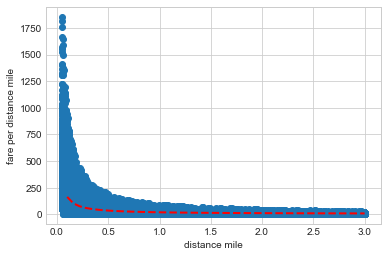

In [45]:
idx = (df_train.distance_miles < 3) & (df_train.fare_amount < 100)
plt.scatter(df_train[idx].distance_miles, df_train[idx].fare_per_mile)
plt.xlabel('distance mile')
plt.ylabel('fare per distance mile')

# theta ici est estimé à la main
theta = (16, 4.0)
x = np.linspace(0.1, 3, 50)
plt.plot(x, theta[0]/x + theta[1], '--', c='r', lw=2);

Notez que le tarif par distance est plus étendu pour les petites distances ( inférieur à 0,5 mile) que pour les grandes distances. Cela pourrait s'expliquer comme suit: nous mesurons la distance d'un point à l'autre et non par la route. Pour des distances plus petites, la différence entre ces deux méthodes de mesure devrait être plus importante. C’est un aspect que nous supposons qu’un modèle plus avancé ( comme deep learning NN) sera meilleur par rapport à un modèle linéaire.
<br>
Une autre raison pour laquelle l'écart est plus grand pour les petites distances pourrait être due à la faible circulation aux heures de pointe. Les courts trajets aux heures de pointe varient davantage en durée.
<br><br>
Continuons avec l'analyse temps vs prix par distance. Nous utilisons ensuite un tableau croisé dynamique de pandas pour réaliser un sommaire et le représenter graphiquement.

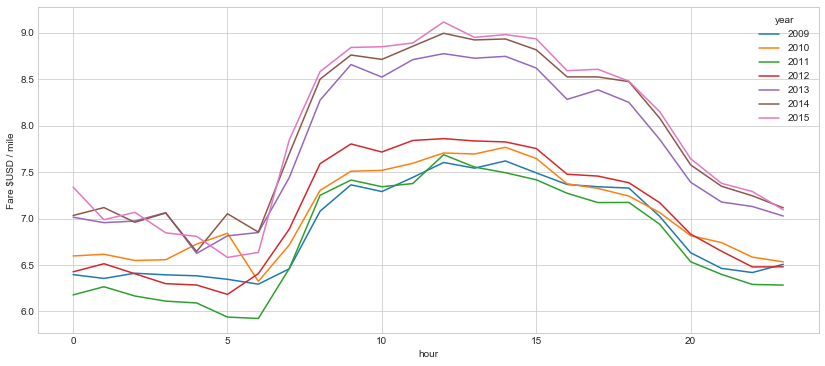

In [46]:
# display pivot table
df_train.pivot_table('fare_per_mile', index='hour', columns='year').plot(figsize=(14,6))
plt.ylabel('Fare $USD / mile');

On peut clairement voir que le tarif USD tarif / mile varie au fil des années et des heures.
<br><br>
Pour approfondir cette question, on a utilisé Google Map pour calculer la durée prévue de deux voyages:
<ul>
<li>Excursion 1: du musée de la ville de New York au théâtre Beacon, 4,5 km, sans quitter Manhatten</li>
<li>Voyage 2: de Times Squared au parc Maria Hermandez, à 12 km, laissant Times Squared via le tunnel Queens Midtown (route à péage)</li>
</ul><br>
Vous trouverez ci-dessous les données et les graphiques. On voit le même type de graphique. La quantité de trafic détermine donc la durée du voyage et donc le tarif. Alors que le volume de trafic dépend de l'heure du jour.

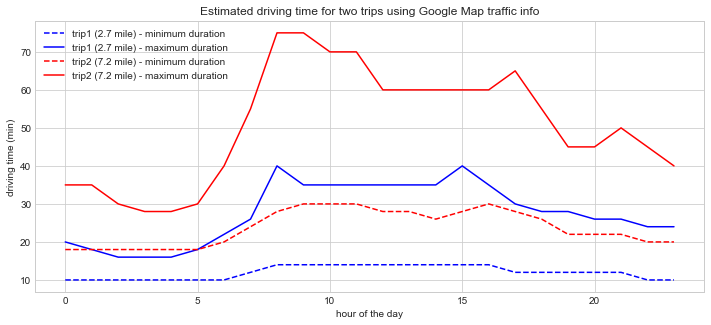

In [47]:
hours = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, \
         13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]

# minimum & maximum des durées en minutes
trip1_min = [10, 10, 10, 10, 10, 10, 10, 12, 14, 14, 14, 14, \
             14, 14, 14, 14, 14, 12, 12, 12, 12, 12, 10, 10]
trip1_max = [20, 18, 16, 16, 16, 18, 22, 26, 40, 35, 35, 35, \
             35, 35, 35, 40, 35, 30, 28, 28, 26, 26, 24, 24]

trip2_min = [18, 18, 18, 18, 18, 18, 20, 24, 28, 30, 30, 30, \
             28, 28, 26, 28, 30, 28, 26, 22, 22, 22, 20, 20]
trip2_max = [35, 35, 30, 28, 28, 30, 40, 55, 75, 75, 70, 70, \
             60, 60, 60, 60, 60, 65, 55, 45, 45, 50, 45, 40]

plt.figure(figsize=(12, 5))
plt.plot(hours, trip1_min, '--', c='b', label="trip1 (2.7 mile) - minimum duration")
plt.plot(hours, trip1_max, '-', c='b', label="trip1 (2.7 mile) - maximum duration")
plt.plot(hours, trip2_min, '--', c='r', label="trip2 (7.2 mile) - minimum duration")
plt.plot(hours, trip2_max, '-', c='r', label="trip2 (7.2 mile) - maximum duration")
plt.xlabel('hour of the day')
plt.ylabel('driving time (min)')
plt.title('Estimated driving time for two trips using Google Map traffic info')
plt.legend();

Une analyse plus approfondie de la dépendance tarif / temps est illustrée ci-dessous<br>
Ici, on calcule par année et par heure le tarif et effectue une régression linéaire. En examinant les visualisations, vous voyez clairement la hausse des prix au fil des ans.

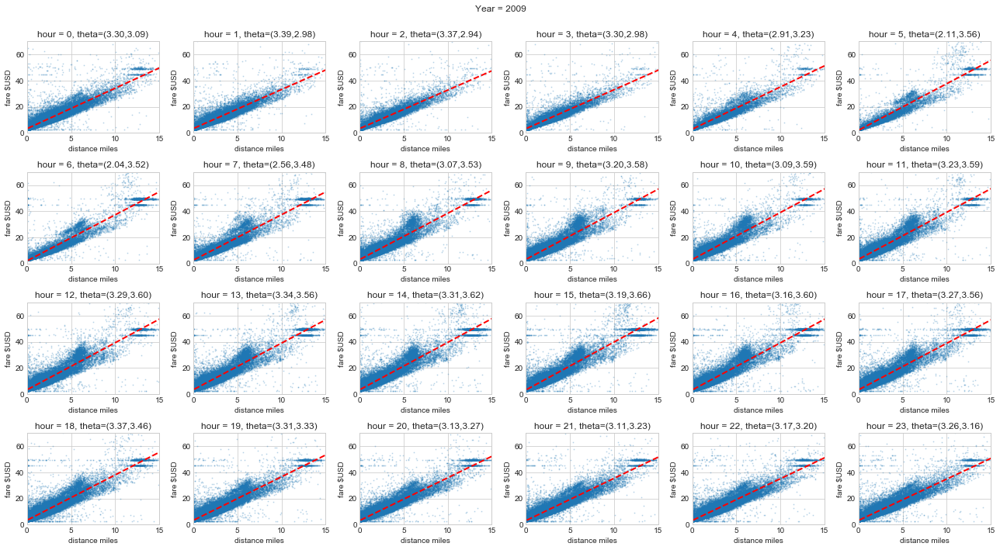

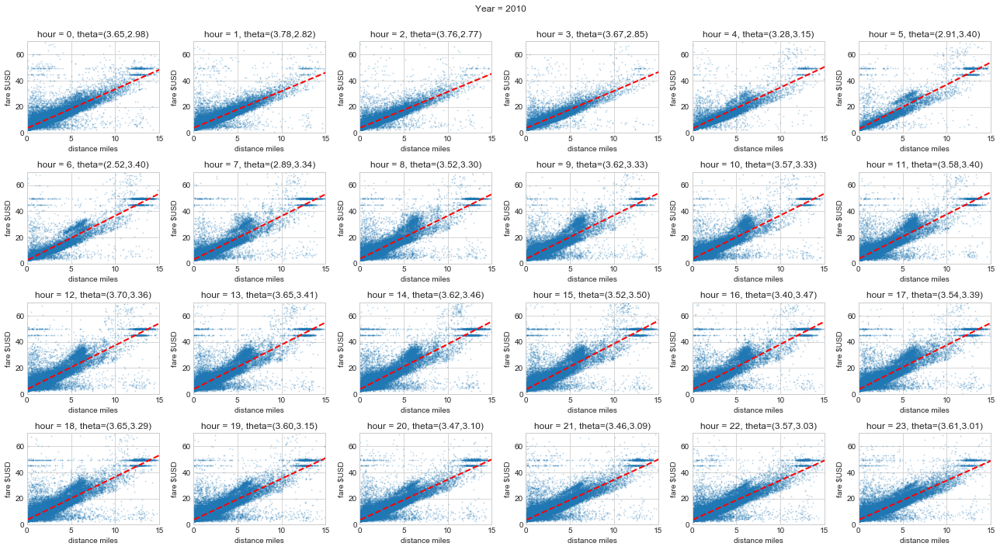

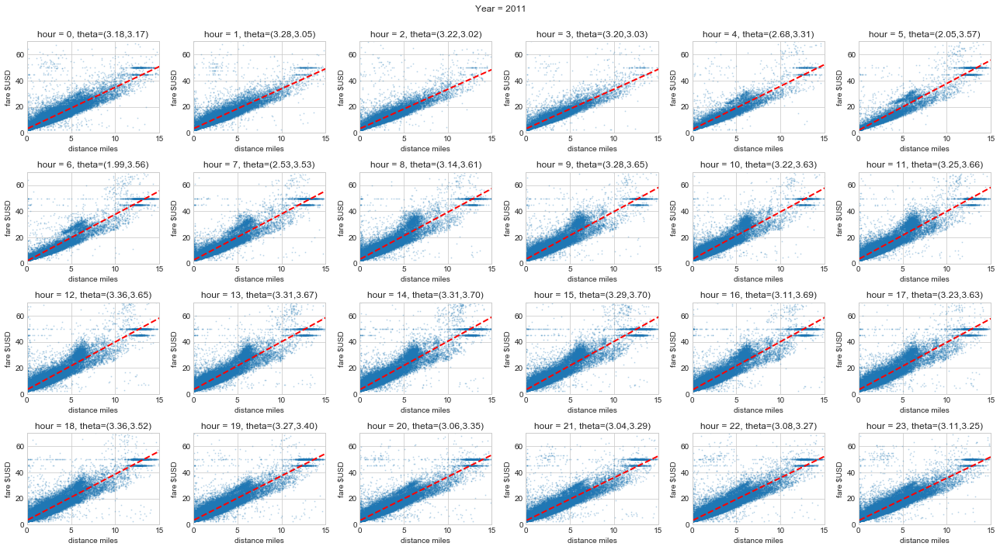

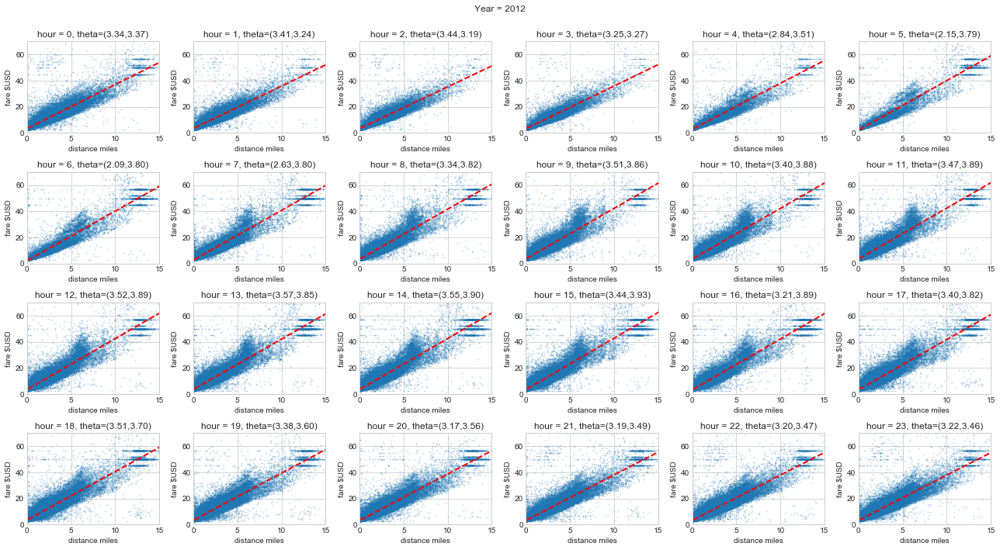

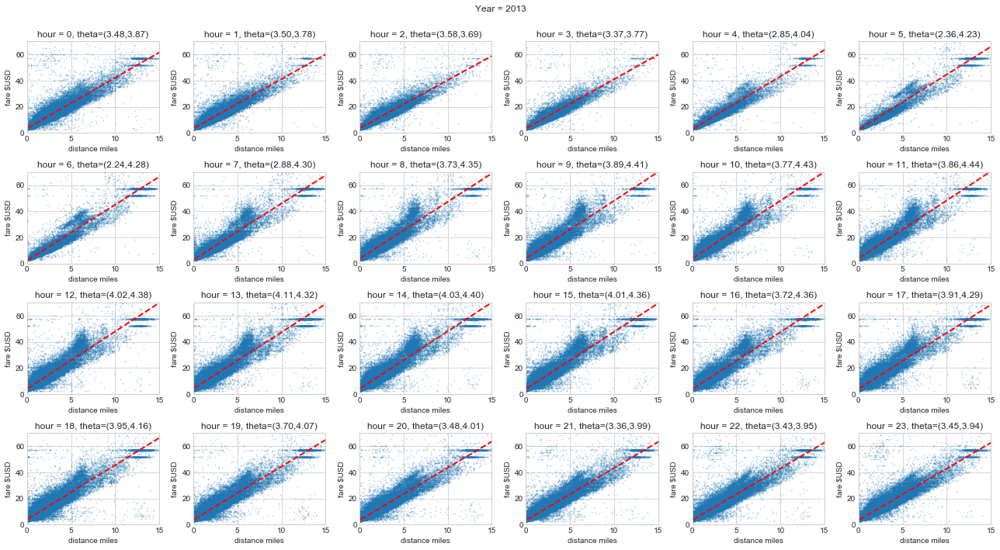

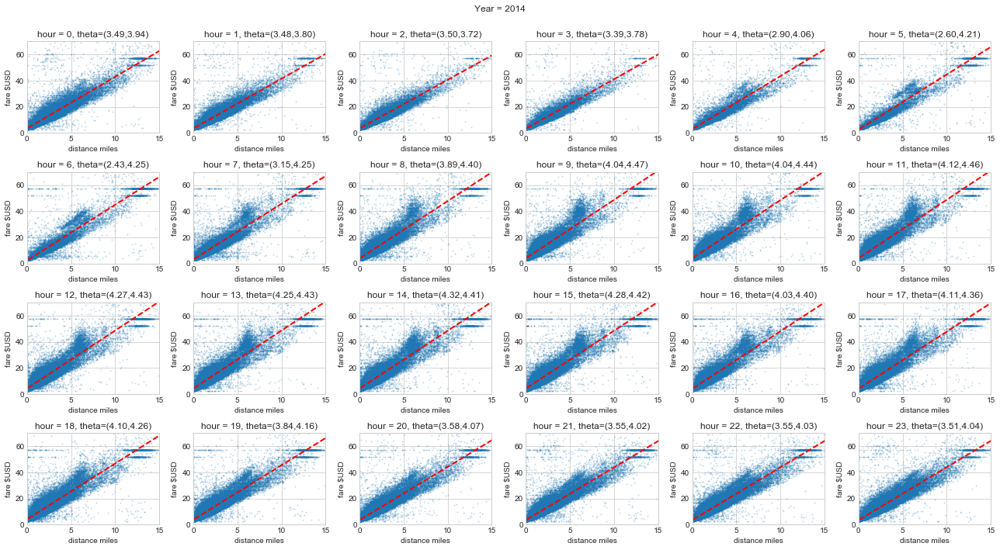

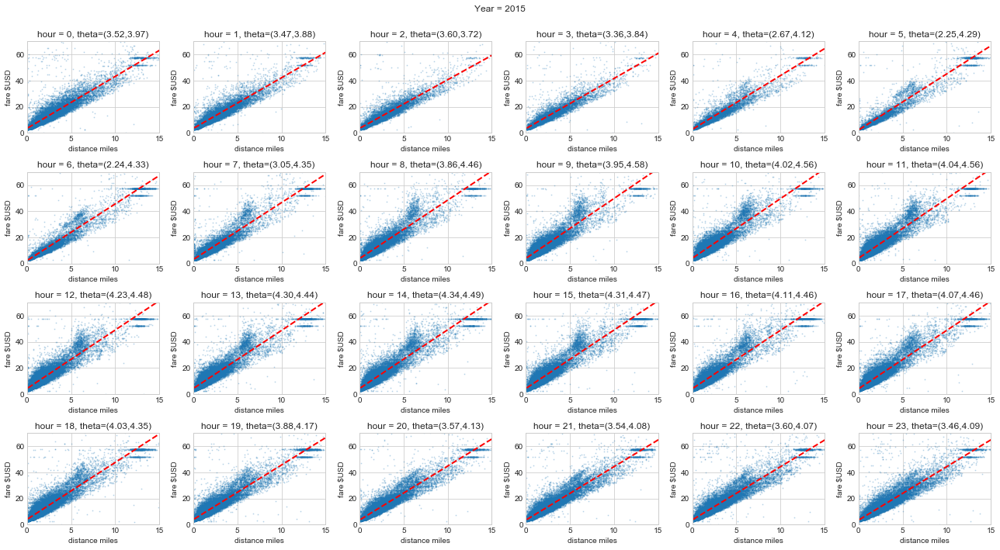

In [48]:
from sklearn.linear_model import LinearRegression

# Visualiser toutes les années
for year in df_train.year.unique():
    # Créer un figure
    fig, axs = plt.subplots(4, 6, figsize=(18, 10))
    axs = axs.ravel()
    
    # Visualiser toutes les heures
    for h in range(24):
        idx = (df_train.distance_miles < 15) & (df_train.fare_amount < 100) & (df_train.hour == h) & \
              (df_train.year == year)
        axs[h].scatter(df_train[idx].distance_miles, df_train[idx].fare_amount, alpha=0.2, s=1)
        axs[h].set_xlabel('distance miles')
        axs[h].set_ylabel('fare $USD')
        axs[h].set_xlim((0, 15))
        axs[h].set_ylim((0, 70))

        model = LinearRegression(fit_intercept=False)
        x, y = df_train[idx].distance_miles.values.reshape(-1,1), df_train[idx].fare_amount.values.reshape(-1,1)
        X = np.concatenate((np.ones(x.shape), x), axis=1)
        model.fit(X, y)
        xx = np.linspace(0.1, 25, 100)
        axs[h].plot(xx, model.coef_[0][0] + xx * model.coef_[0][1], '--', c='r', lw=2)
        axs[h].set_title('hour = {}, theta=({:0.2f},{:0.2f})'.format(h, model.coef_[0][0], model.coef_[0][1]))

    plt.suptitle("Year = {}".format(year))
    plt.tight_layout(rect=[0, 0, 1, 0.95]);

<p style="font-family: Arial; font-size:1.5em;color:#4402C0; font-style:bold">
4) Variation du tarif selon la localisation de départ<br>
</p>

Pour visualiser si le tarif par mile varie en fonction de l’emplacement, la distance du centre de New York est calculée.

In [49]:
# Ajoute d'une nouvelle colonne au dataframe avec une distance en miles par rapport au centre de new york
df_train['distance_to_center'] = distance(nyc[1], nyc[0], df_train.pickup_latitude, df_train.pickup_longitude)

Le tracé de la distance entre le centre de New York et la distance du voyage par rapport au montant du tarif donne un aperçu de cette relation complexe.

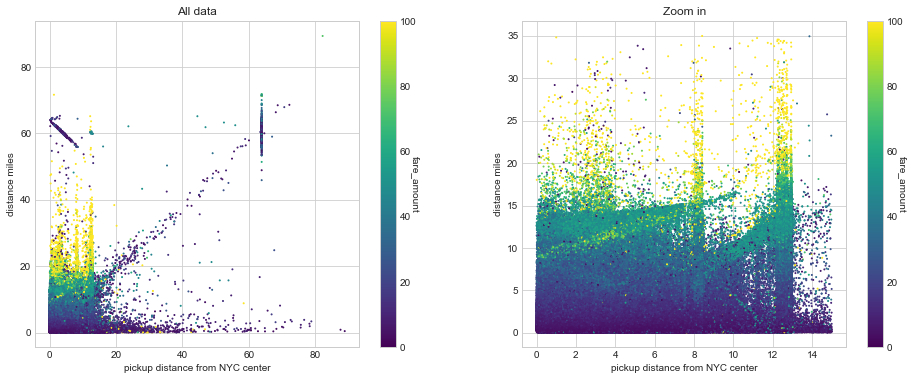

In [50]:
fig, axs = plt.subplots(1, 2, figsize=(16,6))
im = axs[0].scatter(df_train.distance_to_center, df_train.distance_miles, c=np.clip(df_train.fare_amount, 0, 100), 
                     cmap='viridis', alpha=1.0, s=1)
axs[0].set_xlabel('pickup distance from NYC center')
axs[0].set_ylabel('distance miles')
axs[0].set_title('All data')
cbar = fig.colorbar(im, ax=axs[0])
cbar.ax.set_ylabel('fare_amount', rotation=270)

idx = (df_train.distance_to_center < 15) & (df_train.distance_miles < 35)
im = axs[1].scatter(df_train[idx].distance_to_center, df_train[idx].distance_miles, 
                     c=np.clip(df_train[idx].fare_amount, 0, 100), cmap='viridis', alpha=1.0, s=1)
axs[1].set_xlabel('pickup distance from NYC center')
axs[1].set_ylabel('distance miles')
axs[1].set_title('Zoom in')
cbar = fig.colorbar(im, ax=axs[1])
cbar.ax.set_ylabel('fare_amount', rotation=270);

Il y a beaucoup de points «verts», ce qui représente un tarif d'environ 50 à 60 dollars dont la distance au centre est près de 13 miles. Cela pourrait être dû à des trajets de / vers l'aéroport JFK. Nous allons les enlever pour voir ce qui nous reste.

In [51]:
df_train['pickup_distance_to_jfk'] = distance(jfk[1], jfk[0], df_train.pickup_latitude, df_train.pickup_longitude)
df_train['dropoff_distance_to_jfk'] = distance(jfk[1], jfk[0], df_train.dropoff_latitude, df_train.dropoff_longitude)

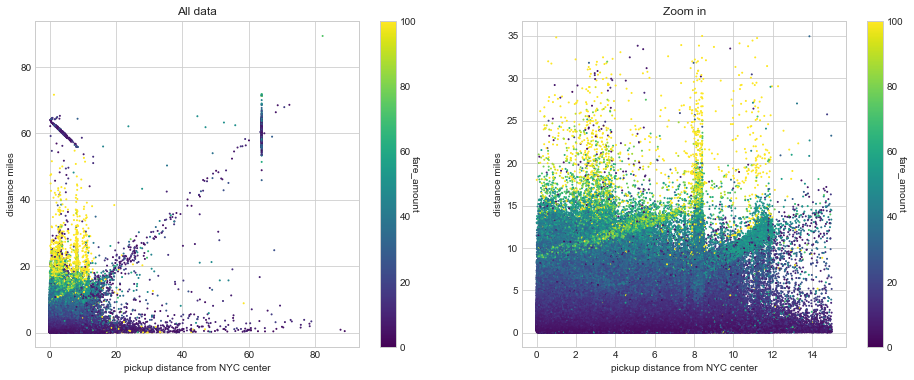

In [52]:
# On supprime tous les points de/à JFK
idx = ~((df_train.pickup_distance_to_jfk < 1) | (df_train.dropoff_distance_to_jfk < 1))

fig, axs = plt.subplots(1, 2, figsize=(16,6))
im = axs[0].scatter(df_train[idx].distance_to_center, df_train[idx].distance_miles, 
                    c=np.clip(df_train[idx].fare_amount, 0, 100), 
                     cmap='viridis', alpha=1.0, s=1)
axs[0].set_xlabel('pickup distance from NYC center')
axs[0].set_ylabel('distance miles')
axs[0].set_title('All data')
cbar = fig.colorbar(im, ax=axs[0])
cbar.ax.set_ylabel('fare_amount', rotation=270)

idx1 = idx & (df_train.distance_to_center < 15) & (df_train.distance_miles < 35)
im = axs[1].scatter(df_train[idx1].distance_to_center, df_train[idx1].distance_miles, 
                     c=np.clip(df_train[idx1].fare_amount, 0, 100), cmap='viridis', alpha=1.0, s=1)
axs[1].set_xlabel('pickup distance from NYC center')
axs[1].set_ylabel('distance miles')
axs[1].set_title('Zoom in')
cbar = fig.colorbar(im, ax=axs[1])
cbar.ax.set_ylabel('fare_amount', rotation=270);

Il reste maintenant des points «jaunes» (montant du tarif> 80 $). <br>
Pour comprendre ces points de données, on les trace sur la carte.

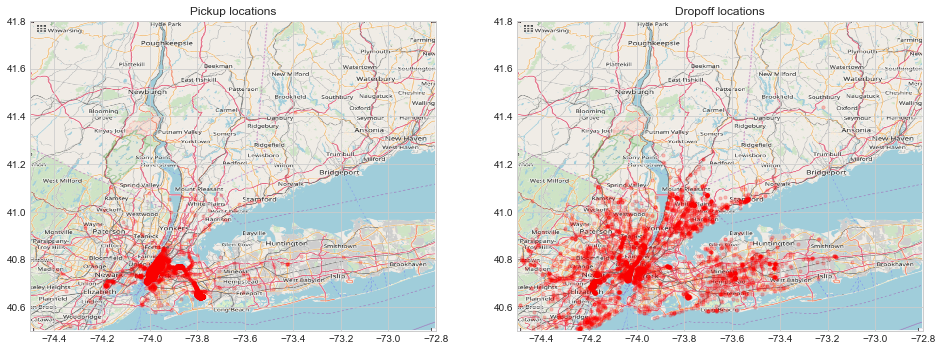

In [53]:
idx = (df_train.fare_amount>80) & (df_train.distance_miles<35) 
plot_on_map(df_train[idx], BB, nyc_map)

Il semble y avoir une concentration de points de données près du point de chute (-74,2, 40,65). Après avoir cherché ces coordonnées sur la carte Google, on a appris que NYC avait un deuxième aéroport: l'aéroport international de Newark Liberty. Le prix de / vers l'aéroport depuis le centre de New York est d'environ 80 à 100 USD.<br>
<br>
Supprimons également ces points de données pour voir si nos conclusions sont exactes. Comme il y a aussi un troisième aéroport, l'aéroport de LaGuardia, on les enlève aussi.

In [54]:
df_train['pickup_distance_to_ewr'] = distance(ewr[1], ewr[0], df_train.pickup_latitude, df_train.pickup_longitude)
df_train['dropoff_distance_to_ewr'] = distance(ewr[1], ewr[0], df_train.dropoff_latitude, df_train.dropoff_longitude)
df_train['pickup_distance_to_lgr'] = distance(lgr[1], lgr[0], df_train.pickup_latitude, df_train.pickup_longitude)
df_train['dropoff_distance_to_lgr'] = distance(lgr[1], lgr[0], df_train.dropoff_latitude, df_train.dropoff_longitude)

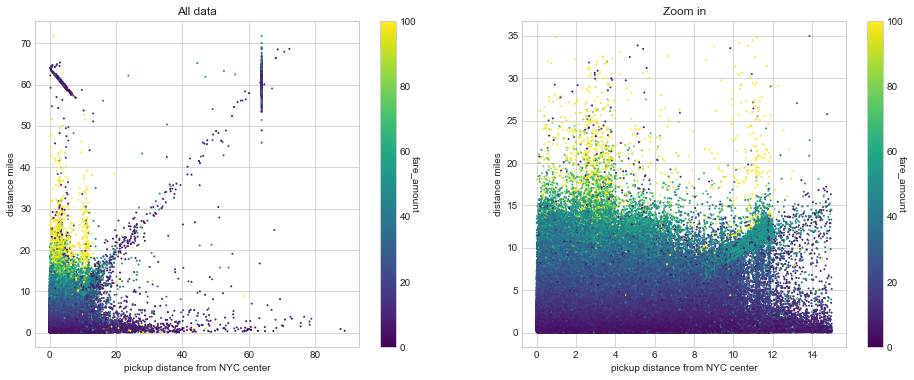

In [55]:
# On supprime les points de/à l'aéroport
idx = ~((df_train.pickup_distance_to_jfk < 1) | (df_train.dropoff_distance_to_jfk < 1) |
        (df_train.pickup_distance_to_ewr < 1) | (df_train.dropoff_distance_to_ewr < 1) |
        (df_train.pickup_distance_to_lgr < 1) | (df_train.dropoff_distance_to_lgr < 1))

fig, axs = plt.subplots(1, 2, figsize=(16,6))
im = axs[0].scatter(df_train[idx].distance_to_center, df_train[idx].distance_miles, 
                    c=np.clip(df_train[idx].fare_amount, 0, 100), 
                     cmap='viridis', alpha=1.0, s=1)
axs[0].set_xlabel('pickup distance from NYC center')
axs[0].set_ylabel('distance miles')
axs[0].set_title('All data')
cbar = fig.colorbar(im, ax=axs[0])
cbar.ax.set_ylabel('fare_amount', rotation=270)

idx1 = idx & (df_train.distance_to_center < 15) & (df_train.distance_miles < 35)
im = axs[1].scatter(df_train[idx1].distance_to_center, df_train[idx1].distance_miles, 
                     c=np.clip(df_train[idx1].fare_amount, 0, 100), cmap='viridis', alpha=1.0, s=1)
axs[1].set_xlabel('pickup distance from NYC center')
axs[1].set_ylabel('distance miles')
axs[1].set_title('Zoom in')
cbar = fig.colorbar(im, ax=axs[1])
cbar.ax.set_ylabel('fare_amount', rotation=270);

La suppression des vols aller / retour à l’aéroport semble donner une vue plus «linéaire» des données. Le montant du tarif dépend de la distance parcourue et non de la position de départ.

<p style="font-family: Arial; font-size:1.5em;color:#4402C0; font-style:bold">
5) Relation entre la direction et le tarif<br>
</p>

Jusqu'à présent, on considérait principalement la distance totale d'un voyage comme une caractéristique principale pour prévoir le montant du tarif. Cependant, qu'en est-il de la direction d'un voyage? Pour visualiser cela, on commence par un simple tracé de la longitude et de la latitude du delta et du montant du tarif.

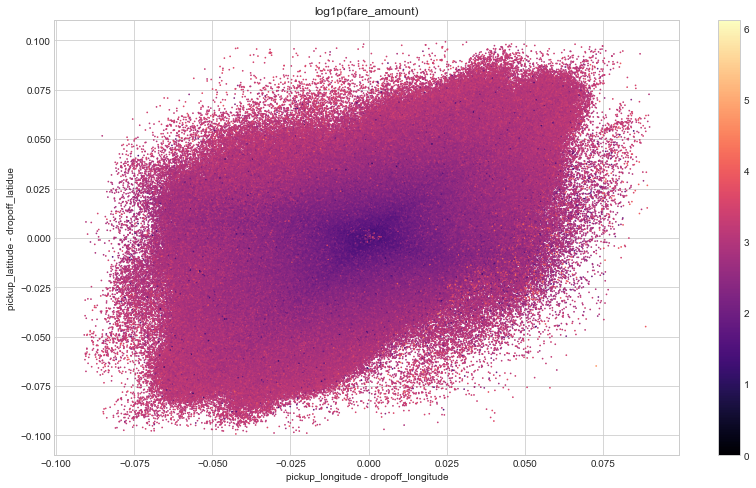

In [56]:
df_train['delta_lon'] = df_train.pickup_longitude - df_train.dropoff_longitude
df_train['delta_lat'] = df_train.pickup_latitude - df_train.dropoff_latitude

# On sélectionne les voyages à Manhattan
BB_manhattan = (-74.025, -73.925, 40.7, 40.8)
idx_manhattan = select_within_boundingbox(df_train, BB_manhattan)

plt.figure(figsize=(14,8))
plt.scatter(df_train[idx_manhattan].delta_lon, df_train[idx_manhattan].delta_lat, s=0.5, alpha=1.0, 
            c=np.log1p(df_train[idx_manhattan].fare_amount), cmap='magma')
plt.colorbar()
plt.xlabel('pickup_longitude - dropoff_longitude')
plt.ylabel('pickup_latitude - dropoff_latidue')
plt.title('log1p(fare_amount)');

Comme on peut le voir sur cette visualisation, la direction du voyage semble avoir de l'importance !!
Par conséquent, calculons la direction précise (en degrés) et traçons la direction par rapport au montant du tarif.

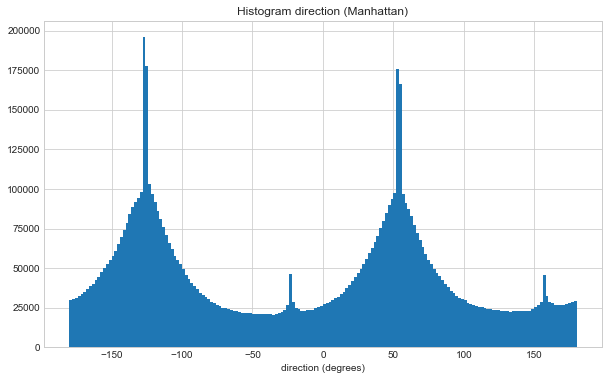

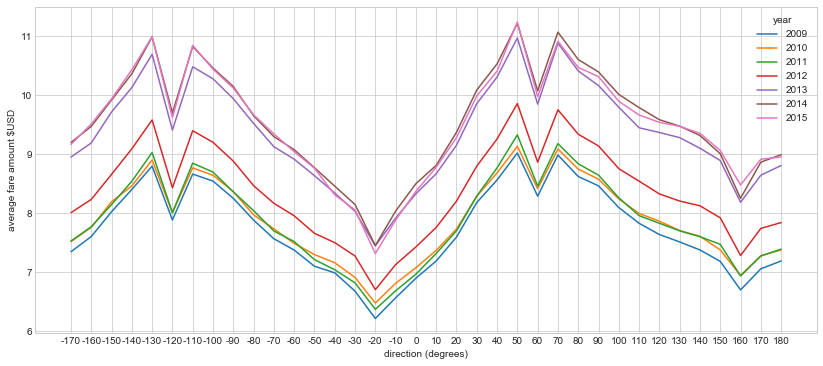

In [57]:
# Direction d'un voyage, de 180 à -180 degrés. Axes horizontaux = 0 degré.
def calculate_direction(d_lon, d_lat):
    result = np.zeros(len(d_lon))
    l = np.sqrt(d_lon**2 + d_lat**2)
    result[d_lon>0] = (180/np.pi)*np.arcsin(d_lat[d_lon>0]/l[d_lon>0])
    idx = (d_lon<0) & (d_lat>0)
    result[idx] = 180 - (180/np.pi)*np.arcsin(d_lat[idx]/l[idx])
    idx = (d_lon<0) & (d_lat<0)
    result[idx] = -180 - (180/np.pi)*np.arcsin(d_lat[idx]/l[idx])
    return result

df_train['direction'] = calculate_direction(df_train.delta_lon, df_train.delta_lat)

# Tracer un histogramme des directions
plt.figure(figsize=(10,6))
df_train[idx_manhattan].direction.hist(bins=180)
plt.xlabel('direction (degrees)')
plt.title('Histogram direction (Manhattan)')

# Tracer la direction par rapport à la moyenne des tarifs
fig, ax = plt.subplots(1, 1, figsize=(14,6))
direc = pd.cut(df_train[idx_manhattan]['direction'], np.linspace(-180, 180, 37))
df_train[idx_manhattan].pivot_table('fare_amount', index=[direc], columns='year', aggfunc='mean').plot(ax=ax)
plt.xlabel('direction (degrees)')
plt.xticks(range(36), np.arange(-170, 190, 10))
plt.ylabel('average fare amount $USD');

Maintenant on est sur que le tarif moyen à Manhattan dépend de la direction. Ce n'est pas surprenant, car les rues de Manhattan ont un angle d'environ 60 degrés avec l'horizon. Dans la direction des 60 degrés, Manhatten est plus long que dans la direction perpendiculaire à celle-ci (-30 degrés). Pour étudier plus en détail l'influence de la direction sur le montant du tarif, nous devrions envisager des trajets d'une certaine longueur. 

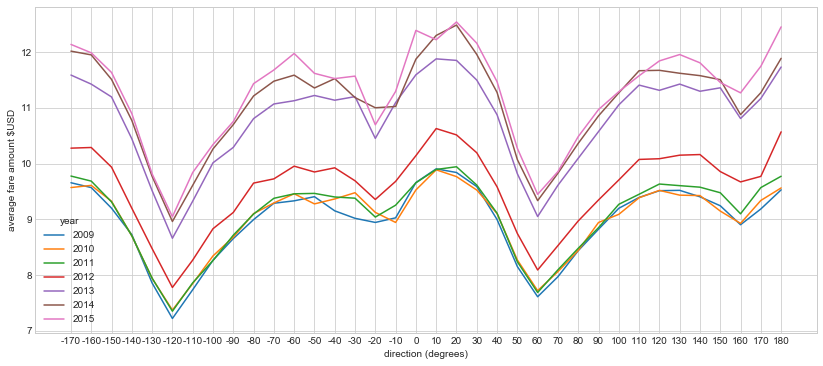

In [58]:
# Sélectionner les trajets à Manhattan avec une distance de +/- 2 miles
idx2 = idx_manhattan & (df_train.distance_miles>1.5) & (df_train.distance_miles<1.7)

# Tracer la direction par rapport à la moyenne des tarifs
fig, ax = plt.subplots(1, 1, figsize=(14,6))
direc = pd.cut(df_train[idx2]['direction'], np.linspace(-180, 180, 37))
df_train[idx2].pivot_table('fare_amount', index=[direc], columns='year', aggfunc='mean').plot(ax=ax)
plt.xlabel('direction (degrees)')
plt.xticks(range(36), np.arange(-170, 190, 10))
plt.ylabel('average fare amount $USD');

Ainsi, même pour des trajets de la même longueur, nous voyons l’influence de la direction sur le montant du tarif.<br>
C'est la raison pour laquelle le tarif moyen pour la direction = 60 ou -120 est le plus bas, car la distance à ces angles est la vraie distance (descendre une rue sans virages). Si la direction est différente de 60 ou -120 degrés, cela signifie que la distance du trajet est en réalité plus grande, donc un montant plus élevé.

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
1-9) Sélection des attributs et préparation des données pour l'apprentissage <br>
</p>

In [59]:
# Ajout des attributs qu'on a ajouté aux données de l'entrainement aux données de test
df_test['distance_miles'] = distance(df_test.pickup_latitude, df_test.pickup_longitude, \
                                     df_test.dropoff_latitude, df_test.dropoff_longitude)
df_test['distance_to_center'] = distance(nyc[1], nyc[0], \
                                          df_test.dropoff_latitude, df_test.dropoff_longitude)
df_test['hour'] = df_test.pickup_datetime.apply(lambda t: pd.to_datetime(t).hour)
df_test['weekday'] = df_test.pickup_datetime.apply(lambda t: t.weekday())
df_test['year'] = df_test.pickup_datetime.apply(lambda t: pd.to_datetime(t).year)
df_test['delta_lon'] = df_test.pickup_longitude - df_test.dropoff_longitude
df_test['delta_lat'] = df_test.pickup_latitude - df_test.dropoff_latitude
df_test['direction'] = calculate_direction(df_test.delta_lon, df_test.delta_lat)

In [60]:
# On sélectionne les points à 15 miles du centre de New York et on supprime les points de données avec zéro passager
idx = (df_train.distance_to_center<15) & (df_train.passenger_count!=0)
# On choisit les attributs 'year', 'hour', 'distance_miles', 'passenger_count' qu'on va utiliser pour l'apprentissage
#features = ['year', 'hour', 'distance_miles', 'passenger_count']
features = ['year','weekday', 'hour', 'distance_miles', 'passenger_count','direction']
X = df_train[idx][features].values
y = df_train[idx]['fare_amount'].values

In [61]:
from sklearn.preprocessing import StandardScaler

X_df_test=df_test[features].values
scaler = StandardScaler()
X_df_test_scaled=scaler.fit_transform(X_df_test)

<h1 style="font-size:2em;color:#2467C0">2) Apprentissage du modèle </h1>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
2-1) En utilisant le holdout <br>
</p>

Le holdout est une méthode qui nous permet de séparer nos données en un ensemble de données d'entrainement et de test, par exemple dans notre cas on va prendre 80% des données de df_train comme données d'entrainement et le reste (20%) seront des données de test

In [62]:
# Import des modules dont on a besoin
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt
import numpy as np

# Fonction qui permet de calculer le RMSE (Root Mean Square Error) entre les valeurs prédites et les valeurs réelles
def error(actual, predicted):
    return sqrt(mean_squared_error(y_test,y_pred))

# On sépare les données en données d'entrainemnt et de test avec la méthode train_test_split() 
# en précisant que 20% sont des données de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

# Créer un dictionnaire vide où on va mettre les valeurs de RMSE pour chaque algorithme de machine learning
Rmse_dict={}
# Créer un dictionnaire vide où on va mettre les prédictions qu'on va uploder à Kaggle 
predictions_dict={}

# En utilisant Linear Regression

In [63]:
# Import des modules de LinearRegression et de StandardScaler et Pipeline 

# Le role de StandardScaler est normaliser les entités en supprimant la moyenne et en adaptant la variance à l'unité
# Le score standard d'un échantillon x est calculé comme suit:
# z = (x - u) / s
# où u est la moyenne des échantillons d'apprentissage et s est l'écart type des échantillons d'apprentissage

# Pipeline nous permet de regrouper plusieurs étapes dont l'input de chaque étape est l'output de l'étape précédente 
# dans un seul objet, dans notre cas les étapes sont la normalisation standard et la création du modèle de machine learning
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('Reg', LinearRegression())]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# On entraine nos données
pipeline.fit(X_train,y_train)
# On prédit le tarif de taxi des données de test
y_pred=pipeline.predict(X_test)
# On calcule l'erreur RMSE entre les valeurs réelles et prédites
Rmse_dict["Linear Regression"]=[error(y_test,y_pred)]

In [64]:
# Afficher le RMSE
error(y_test,y_pred)

4.2615423642930175

In [65]:
# Afficher les valeurs prédites
y_pred

array([15.71632116,  7.01238266,  8.18052756, ...,  6.41228205,
        5.10460864,  9.8045068 ])

In [66]:
predictions_dict["Linear Regression Scaled"]=pipeline.predict(X_df_test_scaled)
predictions_dict["Linear Regression"]=pipeline.predict(X_df_test)

# En utilisant DecisionTreeRegressor

In [67]:
# Import du module DecisionTreeRegressor
from sklearn.tree import DecisionTreeRegressor

# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('tree', DecisionTreeRegressor(random_state=0))]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# On entraine nos données
pipeline.fit(X_train,y_train)
# On prédit le tarif de taxi des données de test
y_pred=pipeline.predict(X_test)
# On calcule l'erreur RMSE entre les valeurs réelles et prédites
Rmse_dict["Decision Tree"]=[error(y_test,y_pred)]

In [68]:
# Afficher le RMSE
error(y_test,y_pred)

4.989341891819823

In [69]:
# Afficher les valeurs prédites
y_pred

array([10.1, 14.5, 10.5, ..., 10.1,  5.7,  7. ])

In [70]:
predictions_dict["Decision Tree Scaled"]=pipeline.predict(X_df_test_scaled)
predictions_dict["Decision Tree"]=pipeline.predict(X_df_test)

# En utilisant Lasso

In [71]:
# Import du module Lasso
from sklearn.linear_model import Lasso

# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('Lasso', Lasso(alpha=0.4))]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# On entraine nos données
pipeline.fit(X_train,y_train)
# On prédit le tarif de taxi des données de test
y_pred=pipeline.predict(X_test)
# On calcule l'erreur RMSE entre les valeurs réelles et prédites
Rmse_dict["Lasso"]=[error(y_test,y_pred)]

In [72]:
# Afficher le RMSE
error(y_test,y_pred)

4.3075555376851895

In [73]:
# Afficher les valeurs prédites
y_pred

array([15.96209231,  7.14711193,  8.23808062, ...,  6.66231295,
        5.74668844,  9.54100388])

In [74]:
predictions_dict["Lasso Scaled"]=pipeline.predict(X_df_test_scaled)
predictions_dict["Lasso"]=pipeline.predict(X_df_test)

# En utilisant Ridge

In [75]:
# Import du module Ridge
from sklearn.linear_model import Ridge

# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('Ridge', Ridge(alpha=1.0))]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# On entraine nos données
pipeline.fit(X_train,y_train)
# On prédit le tarif de taxi des données de test
y_pred=pipeline.predict(X_test)
# On calcule l'erreur RMSE entre les valeurs réelles et prédites
Rmse_dict["Ridge"]=[error(y_test,y_pred)]

In [76]:
# Afficher le RMSE
error(y_test,y_pred)

4.2615423647733275

In [77]:
# Afficher les valeurs prédites
y_pred

array([15.71632058,  7.01238318,  8.180528  , ...,  6.41228264,
        5.10460939,  9.80450704])

In [78]:
predictions_dict["Ridge Scaled"]=pipeline.predict(X_df_test_scaled)
predictions_dict["Ridge"]=pipeline.predict(X_df_test)

# En utilisant ElasticNet

In [79]:
# Import du module ElasticNet
from sklearn.linear_model import ElasticNet

# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('Elastic Net', ElasticNet())]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# On entraine nos données
pipeline.fit(X_train,y_train)
# On prédit le tarif de taxi des données de test
y_pred=pipeline.predict(X_test)
# On calcule l'erreur RMSE entre les valeurs réelles et prédites
Rmse_dict["Elastic Net"]=[error(y_test,y_pred)]

In [80]:
# Afficher le RMSE
error(y_test,y_pred)

5.329795185710682

In [81]:
# Afficher les valeurs prédites
y_pred

array([14.38085151,  8.57460559,  9.26645555, ...,  8.25527849,
        7.6521755 , 10.12466425])

In [82]:
predictions_dict["Elastic Net Scaled"]=pipeline.predict(X_df_test_scaled)
predictions_dict["Elastic Net"]=pipeline.predict(X_df_test)

# En utilisant RandomForestRegressor

In [83]:
# Import du module RandomForestRegressor
from sklearn.ensemble import RandomForestRegressor

# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('RandomForest', RandomForestRegressor(max_depth=2, random_state=0, n_estimators=100))]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# On entraine nos données
pipeline.fit(X_train,y_train)
# On prédit le tarif de taxi des données de test
y_pred=pipeline.predict(X_test)
# On calcule l'erreur RMSE entre les valeurs réelles et prédites
Rmse_dict["Random Forest Regressor"]=[error(y_test,y_pred)]

In [84]:
# Afficher le RMSE
error(y_test,y_pred)

4.788375087155235

In [85]:
# Afficher les valeurs prédites
y_pred

array([14.33234235,  7.32334901,  7.32334901, ...,  7.32334901,
        7.32334901,  7.32334901])

In [86]:
predictions_dict["Random Forest Regressor Scaled"]=pipeline.predict(X_df_test_scaled)
predictions_dict["Random Forest Regressor"]=pipeline.predict(X_df_test)

# En utilisant GradientBoostingRegressor

In [87]:
# Import du module GradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor

# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('gbr', GradientBoostingRegressor(loss='ls', n_estimators=100, learning_rate=0.48))]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# On entraine nos données
pipeline.fit(X_train,y_train)
# On prédit le tarif de taxi des données de test
y_pred=pipeline.predict(X_test)
# On calcule l'erreur RMSE entre les valeurs réelles et prédites
Rmse_dict["Gradient Boosting Regressor"]=[error(y_test,y_pred)]

In [88]:
# Afficher le RMSE
error(y_test,y_pred)

3.498447933212858

In [89]:
# Afficher les valeurs prédites
y_pred

array([11.40943694,  6.3725343 , 10.10764777, ...,  6.81188769,
        4.63138365,  9.33934491])

In [90]:
predictions_dict["Gradient Boosting Regressor Scaled"]=pipeline.predict(X_df_test_scaled)
predictions_dict["Gradient Boosting Regressor"]=pipeline.predict(X_df_test)

In [95]:
# On convertit notre dictionnaire en pandas dataframe et on l'affiche 
result_rmse=pd.DataFrame.from_dict(Rmse_dict)
result_rmse=result_rmse.rename({0: "Holdout (RMSE)"})
result_rmse.head()

,Linear Regression,Decision Tree,Lasso,Ridge,Elastic Net,Random Forest Regressor,Gradient Boosting Regressor,Ada Boost Regressor
Holdout (RMSE),4.261542,4.989342,4.307556,4.261542,5.329795,4.788375,3.498448,7.037117


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
2-2) En utilisant K-Fold cross-validation <br>
</p>

Dans le K-Fold cross-validation, les données sont divisées en k sous-ensembles. Maintenant, la méthode de holdout est répétée k fois, de sorte que l’un des k sous-ensembles est utilisé comme ensemble de test / ensemble de validation et que les k-1 autres sous-ensembles sont regroupés pour former un ensemble d’apprentissage. L'estimation de l'erreur est moyennée sur tous les k essais pour obtenir l'efficacité totale de notre modèle. Comme on peut le constater, chaque point de données doit figurer dans un ensemble de validation exactement une fois, et doit se retrouver dans un ensemble d’apprentissage k-1 fois.
Dans notre cas k=5

In [96]:
# Import des modules cross_val_score, sqrt et fabs 
from sklearn.model_selection import cross_val_score
from math import fabs,sqrt

# Créer un dictionnaire vide où on va mettre la moyenne du scoring de cross-validation pour chaque algorithme de machine learning
Cross_validation={}

# En utilisant Linear Regression

In [97]:
# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('Reg', LinearRegression())]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# Utiliser le cross-validation pour le cas de Linear Regression
cv_score=cross_val_score(pipeline, X, y, cv=5,scoring="neg_mean_squared_error")
# On calcule la moyenne du scoring de cross-validation
Cross_validation["Linear Regression"]=[sqrt(fabs(np.mean(cv_score)))]

# En utilisant DecisionTreeRegressor

In [98]:
# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('tree', DecisionTreeRegressor(random_state=0))]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# Utiliser le cross-validation pour le cas de Decision Tree
cv_score=cross_val_score(pipeline, X, y, cv=5,scoring="neg_mean_squared_error")
# On calcule la moyenne du scoring de cross-validation
Cross_validation["Decision Tree"]=[sqrt(fabs(np.mean(cv_score)))]

# En utilisant Lasso

In [99]:
# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('Lasso', Lasso(alpha=0.4))]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# Utiliser le cross-validation pour le cas de Lasso
cv_score=cross_val_score(pipeline, X, y, cv=5,scoring="neg_mean_squared_error")
# On calcule la moyenne du scoring de cross-validation
Cross_validation["Lasso"]=[sqrt(fabs(np.mean(cv_score)))]

# En utilisant Ridge

In [100]:
# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('Ridge', Ridge(alpha=1.0))]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# Utiliser le cross-validation pour le cas de Ridge
cv_score=cross_val_score(pipeline, X, y, cv=5,scoring="neg_mean_squared_error")
# On calcule la moyenne du scoring de cross-validation
Cross_validation["Ridge"]=[sqrt(fabs(np.mean(cv_score)))]

# En utilisant ElasticNet

In [101]:
# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('Elastic Net', ElasticNet())]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# Utiliser le cross-validation pour le cas de Elastic Net
cv_score=cross_val_score(pipeline, X, y, cv=5,scoring="neg_mean_squared_error")
# On calcule la moyenne du scoring de cross-validation
Cross_validation["Elastic Net"]=[sqrt(fabs(np.mean(cv_score)))]

# En utilisant RandomForestRegressor

In [102]:
# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('RandomForest', RandomForestRegressor(max_depth=2, random_state=0, n_estimators=100))]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# Utiliser le cross-validation pour le cas de Random Forest Regressor
cv_score=cross_val_score(pipeline, X, y, cv=5,scoring="neg_mean_squared_error")
# On calcule la moyenne du scoring de cross-validation
Cross_validation["Random Forest Regressor"]=[sqrt(fabs(np.mean(cv_score)))]

# En utilisant GradientBoostingRegressor

In [105]:
# Configurer les étapes du pipeline: steps
steps = [('scaler', StandardScaler()),
         ('gbr', GradientBoostingRegressor(loss='ls', n_estimators=100, learning_rate=0.48))]
        
# Créer le pipeline: pipeline
pipeline = Pipeline(steps)

# Utiliser le cross-validation pour le cas de Random Forest Regressor
cv_score=cross_val_score(pipeline, X, y, cv=5,scoring="neg_mean_squared_error")
# On calcule la moyenne du scoring de cross-validation
Cross_validation["Gradient Boosting Regressor"]=[sqrt(fabs(np.mean(cv_score)))]

In [107]:
# On convertit notre dictionnaire en pandas dataframe et on l'affiche 
result_cross=pd.DataFrame.from_dict(Cross_validation)
result_cross=result_cross.rename({0: "Cross-validation (RMSE)"})
result_cross.head()

,Linear Regression,Decision Tree,Lasso,Ridge,Elastic Net,Random Forest Regressor,Gradient Boosting Regressor
Cross-validation (RMSE),4.248359,4.98265,4.29432,4.248359,5.316561,4.773487,3.494342


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
2-3) Comparaison entre le cross-validation et le holdout <br>
</p>

In [108]:
# On réalise une concaténation des deux dataframes en un seul dataframe et on l'affiche 
result = pd.concat([result_rmse,result_cross])
result.head()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  


,Ada Boost Regressor,Decision Tree,Elastic Net,Gradient Boosting Regressor,Lasso,Linear Regression,Random Forest Regressor,Ridge
Holdout (RMSE),7.037117,4.989342,5.329795,3.498448,4.307556,4.261542,4.788375,4.261542
Cross-validation (RMSE),NaN,4.982650,5.316561,3.494342,4.294320,4.248359,4.773487,4.248359


En utilisant le holdout et le cross validation on a déduit que le meilleur algorithme est Gradient Boosting Regressor

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
2-4) Utilisation de Neural Network et XGBoost <br>
</p>

In [109]:
scaler = StandardScaler()
X_train_scaled=scaler.fit_transform(X_train,y_train)
X_test_scaled=scaler.fit_transform(X_test,y_test)

# En utilisant Neural Network (RMSE)

In [110]:
import keras
from keras.layers import Dense
from keras.models import Sequential

n_cols = X_train.shape[1]

# Création du modèle
NeuralNet = Sequential()
NeuralNet.add(Dense(13, activation='relu',input_shape = (n_cols,)))
NeuralNet.add(Dense(6, activation='relu'))
NeuralNet.add(Dense(6, activation='relu'))
NeuralNet.add(Dense(6, activation='relu'))
NeuralNet.add(Dense(1, activation='relu'))
# Compiler le  modèle
NeuralNet.compile(loss='mean_squared_error', optimizer='adam')

#Entrainer le modèle
NeuralNet.fit(X_train_scaled, y_train, epochs=15)

C:\ProgramData\Anaconda3\lib\site-packages\h5py\__init__.py:72: UserWarning: h5py is running against HDF5 1.10.2 when it was built against 1.10.3, this may cause problems
  '{0}.{1}.{2}'.format(*version.hdf5_built_version_tuple)
Using TensorFlow backend.


Epoch 1/15
7673618/7673618 [==============================] - 246s 32us/step - loss: 15.6908
Epoch 2/15
7673618/7673618 [==============================] - 242s 32us/step - loss: 14.7959
Epoch 3/15
7673618/7673618 [==============================] - 246s 32us/step - loss: 13.4102
Epoch 4/15
7673618/7673618 [==============================] - 241s 31us/step - loss: 12.9715
Epoch 5/15
7673618/7673618 [==============================] - 239s 31us/step - loss: 12.8410
Epoch 6/15
7673618/7673618 [==============================] - 207s 27us/step - loss: 12.7740
Epoch 7/15
7673618/7673618 [==============================] - 178s 23us/step - loss: 12.6897
Epoch 8/15
7673618/7673618 [==============================] - 186s 24us/step - loss: 12.6363
Epoch 9/15
7673618/7673618 [==============================] - 199s 26us/step - loss: 12.6314
Epoch 10/15
7673618/7673618 [==============================] - 198s 26us/step - loss: 12.6196
Epoch 11/15
7673618/7673618 [==============================] - 203s 2

In [111]:
y_pred=NeuralNet.predict(X_test_scaled)
Rmse_dict["Neural Network"]=[error(y_test,y_pred)]

In [112]:
y_pred

array([[13.2523575],
       [ 7.006868 ],
       [10.922994 ],
       ...,
       [ 6.6712174],
       [ 5.0243692],
       [ 9.248657 ]], dtype=float32)

In [113]:
predictions_dict["Neural Network Scaled"]=NeuralNet.predict(X_df_test_scaled)
predictions_dict["Neural Network"]=NeuralNet.predict(X_df_test)

# En utilisant XGBoost (RMSE)

In [114]:
import sys
print(sys.base_prefix)

C:\ProgramData\Anaconda3


In [115]:
import pip 
! {sys.executable} -m pip install xgboost

In [116]:
import xgboost

xgb_reg = xgboost.XGBRegressor(random_state=42)
xgb_reg.fit(X_train_scaled, y_train)

[02:08:35] Tree method is automatically selected to be 'approx' for faster speed. To use old behavior (exact greedy algorithm on single machine), set tree_method to 'exact'.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=42,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

In [117]:
y_pred=xgb_reg.predict(X_test_scaled)
Rmse_dict["XGBoost"]=[error(y_test,y_pred)]

In [118]:
y_pred

array([12.207821 ,  6.487372 ,  8.616584 , ...,  7.0766377,  4.58438  ,
        7.8188887], dtype=float32)

In [119]:
predictions_dict["XGBoost Scaled"]=xgb_reg.predict(X_df_test_scaled)
predictions_dict["XGBoost"]=xgb_reg.predict(X_df_test)

In [120]:
# On convertit notre dictionnaire en pandas dataframe et on l'affiche 
result_rmse=pd.DataFrame.from_dict(Rmse_dict)
result_rmse=result_rmse.rename({0: "Holdout (RMSE)"})
result_rmse.head()

,Linear Regression,Decision Tree,Lasso,Ridge,Elastic Net,Random Forest Regressor,Gradient Boosting Regressor,Ada Boost Regressor,Neural Network,XGBoost
Holdout (RMSE),4.261542,4.989342,4.307556,4.261542,5.329795,4.788375,3.498448,7.037117,3.548087,3.903355


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
2-5) Kaggle Submissions <br>
</p>

In [121]:
kaggle_submissions={}
kaggle_submissions_Scaled={}

In [122]:
predictions_dict

{'Linear Regression Scaled': array([-1043.82701176, -1043.73468915, -1046.68444809, ...,
        -1028.07283401, -1038.18950211, -1044.86870337]),
 'Linear Regression': array([10.85780625, 10.79810701,  4.72685975, ..., 49.87448997,
        24.10060636,  7.96097494]),
 'Decision Tree Scaled': array([ 2.5,  2.5,  2.5, ..., 15.7,  6.9,  2.5]),
 'Decision Tree': array([11. , 13. ,  4.1, ..., 52. , 21.5,  6. ]),
 'Lasso Scaled': array([-621.36785532, -621.27716355, -623.57108344, ..., -606.39013713,
        -616.01995418, -622.38270518]),
 'Lasso': array([10.01535179, 10.2391967 ,  5.03547623, ..., 46.98327152,
        23.2150113 ,  7.51050508]),
 'Ridge Scaled': array([-1043.82689805, -1043.73457545, -1046.68433401, ...,
        -1028.0727223 , -1038.18938907, -1044.86858947]),
 'Ridge': array([10.85780634, 10.79810708,  4.72686063, ..., 49.87448504,
        24.10060483,  7.96097548]),
 'Elastic Net Scaled': array([-378.54312271, -378.48338591, -379.96467664, ..., -368.6776084 ,
        -

In [123]:
for algorithName,y_pred in predictions_dict.items():
    taxi_fares=pd.DataFrame(y_pred,columns=["fare_amount"])
    submit=pd.concat([df_test["key"], taxi_fares["fare_amount"]], axis=1, keys=['key', 'fare_amount'])
    nameFile="submit/submit_"+algorithName+".csv"
    submit.to_csv(nameFile,index=False)

In [126]:
kaggle_submissions["Linear Regression"]=[5.67034]
kaggle_submissions["Decision Tree"]=[5.31774]
kaggle_submissions["Lasso"]=[5.59628]
kaggle_submissions["Ridge"]=[5.67034]
kaggle_submissions["Elastic Net"]=[5.80764]
kaggle_submissions["Random Forest Regressor"]=[4.89365]
kaggle_submissions["Gradient Boosting Regressor"]=[3.54947]
kaggle_submissions["Ada Boost Regressor"]=[7.47127]
kaggle_submissions["Neural Network"]=[1771.69371]
kaggle_submissions["XGBoost"]=[21.65919]

kaggle_submissions_Scaled["Linear Regression"]=[1055.09547]
kaggle_submissions_Scaled["Decision Tree"]=[10.44859]
kaggle_submissions_Scaled["Lasso"]=[632.29910]
kaggle_submissions_Scaled["Ridge"]=[1055.09536]
kaggle_submissions_Scaled["Elastic Net"]=[389.63849]
kaggle_submissions_Scaled["Random Forest Regressor"]=[9.27877]
kaggle_submissions_Scaled["Gradient Boosting Regressor"]=[9.13387]
kaggle_submissions_Scaled["Ada Boost Regressor"]=[8.61985]
kaggle_submissions_Scaled["Neural Network"]=[3.64299]
kaggle_submissions_Scaled["XGBoost"]=[4.07960]


In [127]:
result_submission=pd.DataFrame.from_dict(kaggle_submissions)
result_submission=result_submission.rename({0: "Score Kaggle Without Scaling"})
result_submission_Scaled=pd.DataFrame.from_dict(kaggle_submissions_Scaled)
result_submission_Scaled=result_submission_Scaled.rename({0: "Score Kaggle with Scaling"})
result_total_submissions = pd.concat([result_submission,result_submission_Scaled])
result_total_submissions.head()

,Linear Regression,Decision Tree,Lasso,Ridge,Elastic Net,Random Forest Regressor,Gradient Boosting Regressor,Ada Boost Regressor,Neural Network,XGBoost
Score Kaggle Without Scaling,5.67034,5.31774,5.59628,5.67034,5.80764,4.89365,3.54947,7.47127,1771.69371,21.65919
Score Kaggle with Scaling,1055.09547,10.44859,632.29910,1055.09536,389.63849,9.27877,9.13387,8.61985,3.64299,4.07960


On remarque le meilleur algorithme lors de la submission est Gradient Boosting Regressor sans utiliser le scaling standard avec un score de 3.54947 qui nous donne un classement de 708 sur 1489